In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
# Standard Libraries
import os
import json
import random
import warnings
from pathlib import Path
from collections import Counter, defaultdict
import pickle

# Data Processing
import numpy as np
import pandas as pd
from PIL import Image
import cv2

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.rnn import pack_padded_sequence
import torchvision
from torchvision import transforms, models

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm

# Metrics
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.model_selection import train_test_split

# Suppress warnings
warnings.filterwarnings('ignore')

# Set seeds for reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Set plot style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print("=" * 80)
print("IMAGE CAPTIONING & ACTION RECOGNITION ASSIGNMENT")
print("=" * 80)
print(f"\n All libraries imported successfully")
print(f" Random seed set to {SEED}")
print(f" PyTorch version: {torch.__version__}")
print(f" Torchvision version: {torchvision.__version__}")

IMAGE CAPTIONING & ACTION RECOGNITION ASSIGNMENT

 All libraries imported successfully
 Random seed set to 42
 PyTorch version: 2.8.0+cu126
 Torchvision version: 0.23.0+cu126


In [2]:
# Check GPU availability
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_gpus = torch.cuda.device_count()

print("\n" + "=" * 80)
print("DEVICE CONFIGURATION")
print("=" * 80)
print(f"\nDevice: {device}")
print(f"Number of GPUs available: {n_gpus}")

if torch.cuda.is_available():
    for i in range(n_gpus):
        print(f"\nGPU {i}: {torch.cuda.get_device_name(i)}")
        print(f"  - Memory Allocated: {torch.cuda.memory_allocated(i) / 1024**3:.2f} GB")
        print(f"  - Memory Reserved: {torch.cuda.memory_reserved(i) / 1024**3:.2f} GB")
        print(f"  - Max Memory Reserved: {torch.cuda.max_memory_reserved(i) / 1024**3:.2f} GB")
else:
    print("\nWARNING: No GPU available! Training will be slow on CPU.")

# Set multi-GPU flag
USE_MULTI_GPU = n_gpus > 1
print(f"\nMulti-GPU Training: {'Enabled' if USE_MULTI_GPU else 'Disabled'}")


DEVICE CONFIGURATION

Device: cuda
Number of GPUs available: 2

GPU 0: Tesla T4
  - Memory Allocated: 0.00 GB
  - Memory Reserved: 0.00 GB
  - Max Memory Reserved: 0.00 GB

GPU 1: Tesla T4
  - Memory Allocated: 0.00 GB
  - Memory Reserved: 0.00 GB
  - Max Memory Reserved: 0.00 GB

Multi-GPU Training: Enabled


In [3]:
# Create directory structure
directories = {
    'models': '/kaggle/working/models',
    'checkpoints': '/kaggle/working/checkpoints',
    'results': '/kaggle/working/results',
    'plots': '/kaggle/working/plots',
    'logs': '/kaggle/working/logs',
    'vocab': '/kaggle/working/vocab',
    'predictions': '/kaggle/working/predictions'
}

print("\n" + "=" * 80)
print("CREATING DIRECTORY STRUCTURE")
print("=" * 80)

for name, path in directories.items():
    os.makedirs(path, exist_ok=True)
    print(f"Created: {path}")

# Global paths
MODELS_DIR = directories['models']
CHECKPOINTS_DIR = directories['checkpoints']
RESULTS_DIR = directories['results']
PLOTS_DIR = directories['plots']
LOGS_DIR = directories['logs']
VOCAB_DIR = directories['vocab']
PREDICTIONS_DIR = directories['predictions']

print(f"\n All directories created successfully")


CREATING DIRECTORY STRUCTURE
Created: /kaggle/working/models
Created: /kaggle/working/checkpoints
Created: /kaggle/working/results
Created: /kaggle/working/plots
Created: /kaggle/working/logs
Created: /kaggle/working/vocab
Created: /kaggle/working/predictions

 All directories created successfully


In [4]:
# ===== IMAGE CAPTIONING HYPERPARAMETERS =====
CAPTION_CONFIG = {
    # Model Architecture
    'embed_size': 256,
    'hidden_size': 512,
    'num_layers': 2,
    'dropout': 0.5,
    
    # Training
    'batch_size': 64,
    'num_epochs': 15,
    'learning_rate': 3e-4,
    'grad_clip': 5.0,
    
    # Data Processing
    'max_caption_length': 50,
    'min_word_freq': 5,
    'vocab_size': None,  # Will be set after vocab creation
    
    # Image Processing
    'image_size': 224,
    'crop_size': 224,
}

# ===== ACTION RECOGNITION HYPERPARAMETERS =====
ACTION_CONFIG = {
    # Model Architecture
    'num_classes': 40,  # Stanford 40 Actions
    'dropout': 0.5,
    'freeze_backbone': False,  # Fine-tune entire network
    
    # Training
    'batch_size': 32,
    'num_epochs': 20,
    'learning_rate': 1e-4,
    'weight_decay': 1e-4,
    
    # Image Processing
    'image_size': 224,
    'crop_size': 224,
}

# ===== SHARED CONFIGURATIONS =====
SHARED_CONFIG = {
    'num_workers': 4,
    'pin_memory': True,
    'patience': 5,  # Early stopping patience
    'save_frequency': 1,  # Save checkpoint every N epochs
}

# Print configurations
print("\n--- Image Captioning Configuration ---")
for key, value in CAPTION_CONFIG.items():
    print(f"  {key:25s}: {value}")

print("\n--- Action Recognition Configuration ---")
for key, value in ACTION_CONFIG.items():
    print(f"  {key:25s}: {value}")

print("\n--- Shared Configuration ---")
for key, value in SHARED_CONFIG.items():
    print(f"  {key:25s}: {value}")

print(f"\n Hyperparameters configured successfully")


--- Image Captioning Configuration ---
  embed_size               : 256
  hidden_size              : 512
  num_layers               : 2
  dropout                  : 0.5
  batch_size               : 64
  num_epochs               : 15
  learning_rate            : 0.0003
  grad_clip                : 5.0
  max_caption_length       : 50
  min_word_freq            : 5
  vocab_size               : None
  image_size               : 224
  crop_size                : 224

--- Action Recognition Configuration ---
  num_classes              : 40
  dropout                  : 0.5
  freeze_backbone          : False
  batch_size               : 32
  num_epochs               : 20
  learning_rate            : 0.0001
  weight_decay             : 0.0001
  image_size               : 224
  crop_size                : 224

--- Shared Configuration ---
  num_workers              : 4
  pin_memory               : True
  patience                 : 5
  save_frequency           : 1

 Hyperparameters configured succ

In [5]:
# ===== FLICKR8K DATASET PATHS =====
FLICKR8K_PATH = '/kaggle/input/flicker8k'
FLICKR8K_IMAGES_PATH = '/kaggle/input/flicker8k/Flickr8k_Dataset/Flicker8k_Dataset'
FLICKR8K_CAPTIONS_PATH = '/kaggle/input/flicker8k/Flickr8k_text/Flickr8k.token.txt'

# Alternative caption files (we'll check which one exists)
FLICKR8K_CAPTION_FILES = {
    'token': '/kaggle/input/flicker8k/Flickr8k_text/Flickr8k.token.txt',
    'lemma': '/kaggle/input/flicker8k/Flickr8k_text/Flickr8k.lemma.token.txt',
    'crowd': '/kaggle/input/flicker8k/Flickr8k_text/CrowdFlowerAnnotations.txt',
    'expert': '/kaggle/input/flicker8k/Flickr8k_text/ExpertAnnotations.txt'
}

# Train/Dev/Test split files
FLICKR8K_TRAIN_IMAGES = '/kaggle/input/flicker8k/Flickr8k_text/Flickr_8k.trainImages.txt'
FLICKR8K_DEV_IMAGES = '/kaggle/input/flicker8k/Flickr8k_text/Flickr_8k.devImages.txt'
FLICKR8K_TEST_IMAGES = '/kaggle/input/flicker8k/Flickr8k_text/Flickr_8k.testImages.txt'

# ===== ACTION RECOGNITION DATASET PATHS =====
ACTION_DATASET_PATH = '/kaggle/input/human-action-recognition-dataset'
ACTION_TRAIN_PATH = '/kaggle/input/human-action-recognition-dataset/Structured/train'
ACTION_TEST_PATH = '/kaggle/input/human-action-recognition-dataset/Structured/test'

# ===== VERIFY PATHS =====
print("\n--- Flickr8k Dataset ---")
print(f"Base Path: {FLICKR8K_PATH}")
print(f"  Exists: {'' if os.path.exists(FLICKR8K_PATH) else '❌'}")

print(f"\nImages Path: {FLICKR8K_IMAGES_PATH}")
if os.path.exists(FLICKR8K_IMAGES_PATH):
    num_images = len([f for f in os.listdir(FLICKR8K_IMAGES_PATH) if f.endswith(('.jpg', '.png', '.jpeg'))])
    print(f"  Exists: ")
    print(f"  Images Found: {num_images}")
else:
    print(f"  Exists: ❌")

print(f"\nCaption Files:")
for name, path in FLICKR8K_CAPTION_FILES.items():
    exists = os.path.exists(path)
    print(f"  {name:10s}: {'' if exists else '❌'} - {path}")
    if exists and name == 'token':
        FLICKR8K_CAPTIONS_PATH = path  # Use token file as main caption source

print(f"\nSplit Files:")
for split_name, split_path in [('Train', FLICKR8K_TRAIN_IMAGES), 
                                 ('Dev', FLICKR8K_DEV_IMAGES), 
                                 ('Test', FLICKR8K_TEST_IMAGES)]:
    exists = os.path.exists(split_path)
    print(f"  {split_name:10s}: {'' if exists else '❌'}")

print("\n--- Action Recognition Dataset ---")
print(f"Base Path: {ACTION_DATASET_PATH}")
print(f"  Exists: {'' if os.path.exists(ACTION_DATASET_PATH) else '❌'}")

print(f"\nTrain Path: {ACTION_TRAIN_PATH}")
if os.path.exists(ACTION_TRAIN_PATH):
    num_classes_train = len([d for d in os.listdir(ACTION_TRAIN_PATH) if os.path.isdir(os.path.join(ACTION_TRAIN_PATH, d))])
    print(f"  Exists: ")
    print(f"  Classes Found: {num_classes_train}")
else:
    print(f"  Exists: ❌")

print(f"\nTest Path: {ACTION_TEST_PATH}")
if os.path.exists(ACTION_TEST_PATH):
    num_classes_test = len([d for d in os.listdir(ACTION_TEST_PATH) if os.path.isdir(os.path.join(ACTION_TEST_PATH, d))])
    print(f"  Exists: ")
    print(f"  Classes Found: {num_classes_test}")
else:
    print(f"  Exists: ❌")

# ===== FINAL VALIDATION =====
print("\n" + "=" * 80)
print("VALIDATION SUMMARY")
print("=" * 80)

flickr8k_ready = (os.path.exists(FLICKR8K_IMAGES_PATH) and 
                   os.path.exists(FLICKR8K_CAPTIONS_PATH))
action_ready = (os.path.exists(ACTION_TRAIN_PATH) and 
                os.path.exists(ACTION_TEST_PATH))

if flickr8k_ready:
    print("Flickr8k Dataset: READY")
else:
    print("Flickr8k Dataset: NOT READY")

if action_ready:
    print("Action Recognition Dataset: READY")
else:
    print("Action Recognition Dataset: NOT READY")

if flickr8k_ready and action_ready:
    print("\nALL DATASETS CONFIGURED AND VERIFIED!")
    print("Proceeding to data analysis...")
else:
    print("\nSome datasets not ready - please check paths")

print("=" * 80)


--- Flickr8k Dataset ---
Base Path: /kaggle/input/flicker8k
  Exists: 

Images Path: /kaggle/input/flicker8k/Flickr8k_Dataset/Flicker8k_Dataset
  Exists: 
  Images Found: 8091

Caption Files:
  token     :  - /kaggle/input/flicker8k/Flickr8k_text/Flickr8k.token.txt
  lemma     :  - /kaggle/input/flicker8k/Flickr8k_text/Flickr8k.lemma.token.txt
  crowd     :  - /kaggle/input/flicker8k/Flickr8k_text/CrowdFlowerAnnotations.txt
  expert    :  - /kaggle/input/flicker8k/Flickr8k_text/ExpertAnnotations.txt

Split Files:
  Train     : 
  Dev       : 
  Test      : 

--- Action Recognition Dataset ---
Base Path: /kaggle/input/human-action-recognition-dataset
  Exists: 

Train Path: /kaggle/input/human-action-recognition-dataset/Structured/train
  Exists: 
  Classes Found: 15

Test Path: /kaggle/input/human-action-recognition-dataset/Structured/test
  Exists: 
  Classes Found: 15

VALIDATION SUMMARY
Flickr8k Dataset: READY
Action Recognition Dataset: READY

ALL DATASETS CONFIGURED AND VERIFIED!

In [6]:
# ===== ANALYZE FLICKR8K =====
if os.path.exists(FLICKR8K_IMAGES_PATH) and os.path.exists(FLICKR8K_CAPTIONS_PATH):
    # Count images
    image_files = [f for f in os.listdir(FLICKR8K_IMAGES_PATH) 
                   if f.endswith(('.jpg', '.png', '.jpeg', '.JPG', '.PNG', '.JPEG'))]
    print(f"\n Total Images: {len(image_files)}")
    print(f"  Sample images: {image_files[:5]}")
    
    # Analyze captions file
    print(f"\n Caption File: {os.path.basename(FLICKR8K_CAPTIONS_PATH)}")
    with open(FLICKR8K_CAPTIONS_PATH, 'r', encoding='utf-8') as f:
        caption_lines = f.readlines()
    
    print(f"  Total caption lines: {len(caption_lines)}")
    print(f"  Sample captions:")
    for i, line in enumerate(caption_lines[:3], 1):
        parts = line.strip().split('\t') if '\t' in line else line.strip().split()
        if len(parts) >= 2:
            print(f"    {i}. {parts[0][:30]}... -> {' '.join(parts[1:])[:60]}...")
    
    # Analyze splits
    splits_info = {}
    for split_name, split_path in [('train', FLICKR8K_TRAIN_IMAGES),
                                     ('dev', FLICKR8K_DEV_IMAGES),
                                     ('test', FLICKR8K_TEST_IMAGES)]:
        if os.path.exists(split_path):
            with open(split_path, 'r') as f:
                split_images = [line.strip() for line in f.readlines()]
            splits_info[split_name] = len(split_images)
            print(f"\n {split_name.capitalize()} Split: {len(split_images)} images")
        else:
            print(f"\n {split_name.capitalize()} Split: Not found (will create manually)")
    
    # Calculate caption statistics
    unique_images = set()
    total_captions = 0
    for line in caption_lines:
        parts = line.strip().split('\t') if '\t' in line else line.strip().split('#')
        if len(parts) >= 1:
            img_id = parts[0].split('#')[0]
            unique_images.add(img_id)
            total_captions += 1
    
    print(f"\n Unique images with captions: {len(unique_images)}")
    print(f" Total captions: {total_captions}")
    print(f" Captions per image: {total_captions / len(unique_images):.1f}")
    
else:
    print("\nFlickr8k dataset not accessible")


action_classes = []
train_distribution = {}
test_distribution = {}

if os.path.exists(ACTION_TRAIN_PATH):
    print("\n--- Training Set ---")
    train_classes = sorted([d for d in os.listdir(ACTION_TRAIN_PATH) 
                           if os.path.isdir(os.path.join(ACTION_TRAIN_PATH, d))])
    
    print(f"Number of classes: {len(train_classes)}")
    print(f"\nClass Distribution:")
    
    total_train_images = 0
    for cls in train_classes:
        cls_path = os.path.join(ACTION_TRAIN_PATH, cls)
        num_images = len([f for f in os.listdir(cls_path) 
                         if f.endswith(('.jpg', '.png', '.jpeg', '.JPG', '.PNG', '.JPEG'))])
        train_distribution[cls] = num_images
        total_train_images += num_images
    
    # Sort by number of images
    sorted_classes = sorted(train_distribution.items(), key=lambda x: x[1], reverse=True)
    
    for idx, (cls, count) in enumerate(sorted_classes, 1):
        print(f"  {idx:2d}. {cls:30s}: {count:4d} images")
    
    print(f"\nTotal training images: {total_train_images}")
    print(f"Average images per class: {total_train_images / len(train_classes):.1f}")
    print(f"Min images per class: {min(train_distribution.values())}")
    print(f"Max images per class: {max(train_distribution.values())}")
    
    action_classes = train_classes
else:
    print("\nTraining set not accessible")

if os.path.exists(ACTION_TEST_PATH):
    print("\n--- Test Set ---")
    test_classes = sorted([d for d in os.listdir(ACTION_TEST_PATH) 
                          if os.path.isdir(os.path.join(ACTION_TEST_PATH, d))])
    
    print(f"Number of classes: {len(test_classes)}")
    
    total_test_images = 0
    for cls in test_classes:
        cls_path = os.path.join(ACTION_TEST_PATH, cls)
        num_images = len([f for f in os.listdir(cls_path) 
                         if f.endswith(('.jpg', '.png', '.jpeg', '.JPG', '.PNG', '.JPEG'))])
        test_distribution[cls] = num_images
        total_test_images += num_images
    
    print(f"Total test images: {total_test_images}")
    print(f"Average images per class: {total_test_images / len(test_classes):.1f}")
else:
    print("\nTest set not accessible")

# ===== UPDATE CONFIG WITH ACTUAL CLASS INFO =====
if action_classes:
    ACTION_CONFIG['num_classes'] = len(action_classes)
    ACTION_CONFIG['class_names'] = action_classes
    
    print("\n" + "=" * 80)
    print("UPDATED ACTION_CONFIG")
    print("=" * 80)
    print(f"Number of classes: {ACTION_CONFIG['num_classes']}")
    print(f"Class names stored in ACTION_CONFIG['class_names']")

# ===== FINAL SUMMARY =====
print("\n" + "=" * 80)
print("DATASET ANALYSIS COMPLETE")
print("=" * 80)
print("\nSummary:")
if os.path.exists(FLICKR8K_IMAGES_PATH):
    print(f"  • Flickr8k: {len(image_files)} images for captioning")
if os.path.exists(ACTION_TRAIN_PATH):
    print(f"  • Action Recognition: {total_train_images} training images")
    print(f"  • Action Recognition: {total_test_images} test images")
    print(f"  • Total action classes: {len(action_classes)}")

print("\nReady to proceed with data preprocessing!")
print("=" * 80)


 Total Images: 8091
  Sample images: ['3226254560_2f8ac147ea.jpg', '214543992_ce6c0d9f9b.jpg', '2366643786_9c9a830db8.jpg', '3368819708_0bfa0808f8.jpg', '2190227737_6e0bde2623.jpg']

 Caption File: Flickr8k.token.txt
  Total caption lines: 40460
  Sample captions:
    1. 1000268201_693b08cb0e.jpg#0... -> A child in a pink dress is climbing up a set of stairs in an...
    2. 1000268201_693b08cb0e.jpg#1... -> A girl going into a wooden building ....
    3. 1000268201_693b08cb0e.jpg#2... -> A little girl climbing into a wooden playhouse ....

 Train Split: 6000 images

 Dev Split: 1000 images

 Test Split: 1000 images

 Unique images with captions: 8092
 Total captions: 40460
 Captions per image: 5.0

--- Training Set ---
Number of classes: 15

Class Distribution:
   1. calling                       :  714 images
   2. clapping                      :  714 images
   3. cycling                       :  714 images
   4. dancing                       :  714 images
   5. drinking             


--- Flickr8k Sample Images with Captions ---
 Loaded captions for 8092 images
 Sample visualization saved to: /kaggle/working/plots/flickr8k_samples.png


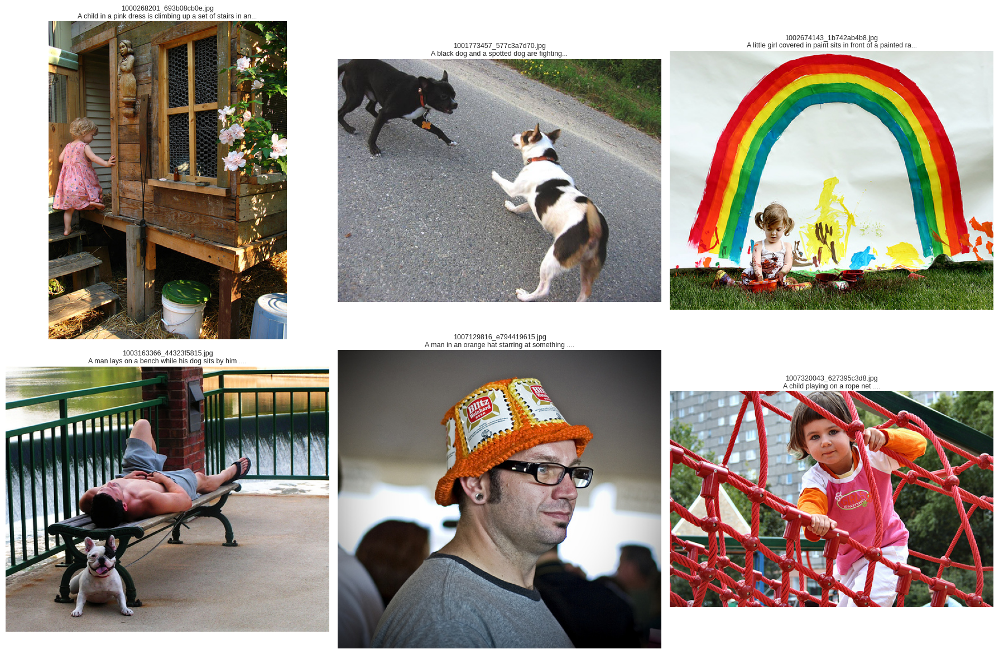


--- Action Recognition Sample Images ---
 Sample visualization saved to: /kaggle/working/plots/action_samples.png


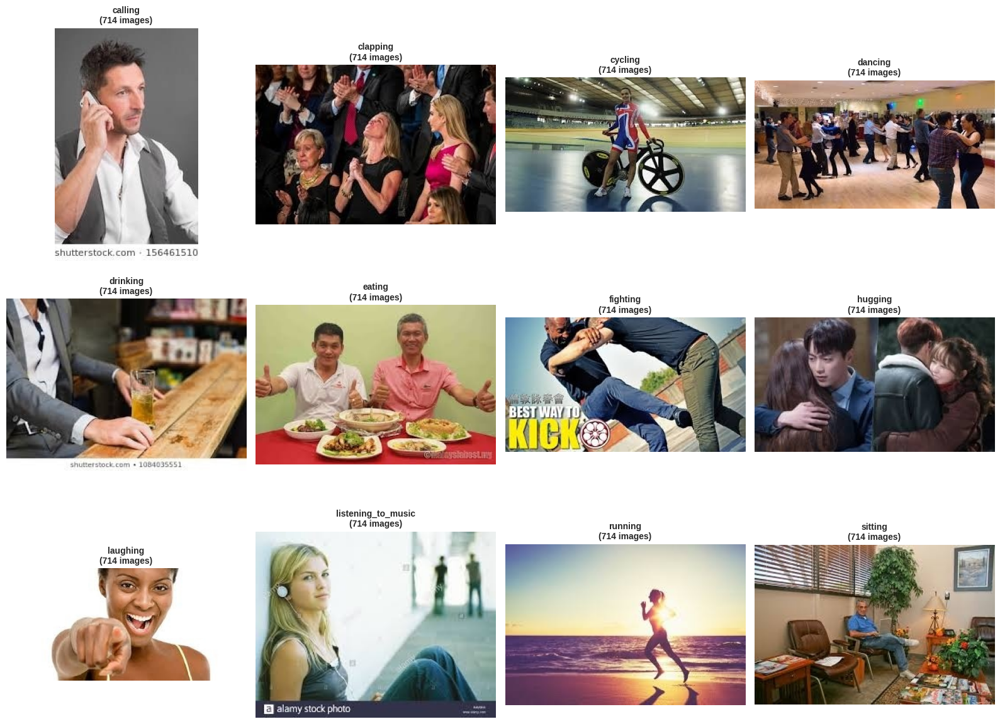


--- Action Recognition Class Distribution ---
 Distribution plot saved to: /kaggle/working/plots/class_distribution.png


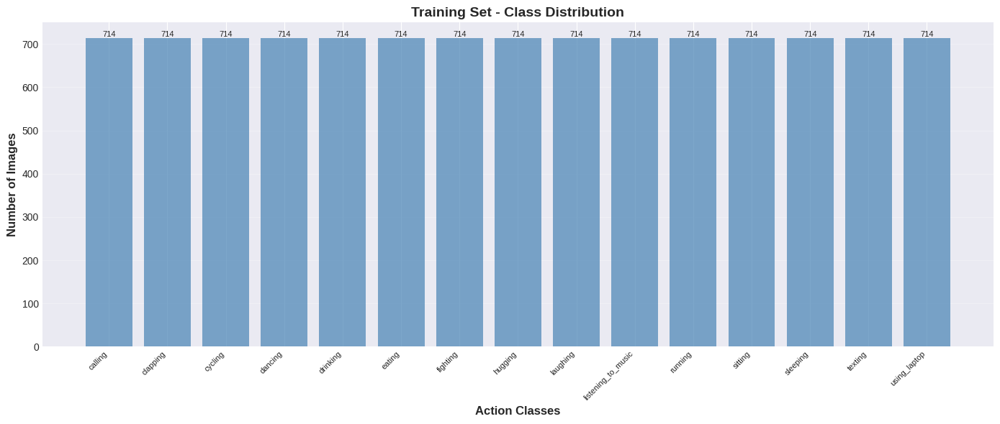

In [7]:
# ===== VISUALIZE FLICKR8K SAMPLES =====
if os.path.exists(FLICKR8K_IMAGES_PATH) and os.path.exists(FLICKR8K_CAPTIONS_PATH):
    print("\n--- Flickr8k Sample Images with Captions ---")
    
    # Load captions
    captions_dict = {}
    with open(FLICKR8K_CAPTIONS_PATH, 'r', encoding='utf-8') as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            
            # Parse line (format: image.jpg#0	caption text)
            if '\t' in line:
                img_caption = line.split('\t')
                if len(img_caption) == 2:
                    img_info, caption = img_caption
                    img_name = img_info.split('#')[0]
                    
                    if img_name not in captions_dict:
                        captions_dict[img_name] = []
                    captions_dict[img_name].append(caption)
    
    print(f" Loaded captions for {len(captions_dict)} images")
    
    # Display sample images with captions
    sample_images = list(captions_dict.keys())[:6]
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.ravel()
    
    for idx, img_name in enumerate(sample_images):
        img_path = os.path.join(FLICKR8K_IMAGES_PATH, img_name)
        
        if os.path.exists(img_path):
            img = Image.open(img_path).convert('RGB')
            axes[idx].imshow(img)
            axes[idx].axis('off')
            
            # Show first caption
            caption_text = captions_dict[img_name][0]
            axes[idx].set_title(f"{img_name}\n{caption_text[:60]}...", 
                               fontsize=9, wrap=True)
    
    plt.tight_layout()
    plt.savefig(os.path.join(PLOTS_DIR, 'flickr8k_samples.png'), 
                dpi=100, bbox_inches='tight')
    print(f" Sample visualization saved to: {PLOTS_DIR}/flickr8k_samples.png")
    plt.show()

# ===== VISUALIZE ACTION RECOGNITION SAMPLES =====
if os.path.exists(ACTION_TRAIN_PATH):
    print("\n--- Action Recognition Sample Images ---")
    
    # Get sample from each class (first 12 classes)
    sample_classes = action_classes[:12]
    
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    axes = axes.ravel()
    
    for idx, cls_name in enumerate(sample_classes):
        cls_path = os.path.join(ACTION_TRAIN_PATH, cls_name)
        images = [f for f in os.listdir(cls_path) 
                 if f.endswith(('.jpg', '.png', '.jpeg'))]
        
        if images:
            sample_img_path = os.path.join(cls_path, images[0])
            img = Image.open(sample_img_path).convert('RGB')
            axes[idx].imshow(img)
            axes[idx].axis('off')
            axes[idx].set_title(f"{cls_name}\n({len(images)} images)", 
                               fontsize=10, weight='bold')
    
    plt.tight_layout()
    plt.savefig(os.path.join(PLOTS_DIR, 'action_samples.png'), 
                dpi=100, bbox_inches='tight')
    print(f" Sample visualization saved to: {PLOTS_DIR}/action_samples.png")
    plt.show()

# ===== CLASS DISTRIBUTION PLOT =====
if train_distribution:
    print("\n--- Action Recognition Class Distribution ---")
    
    fig, ax = plt.subplots(figsize=(14, 6))
    
    classes = list(train_distribution.keys())
    counts = list(train_distribution.values())
    
    bars = ax.bar(range(len(classes)), counts, color='steelblue', alpha=0.7)
    ax.set_xlabel('Action Classes', fontsize=12, weight='bold')
    ax.set_ylabel('Number of Images', fontsize=12, weight='bold')
    ax.set_title('Training Set - Class Distribution', fontsize=14, weight='bold')
    ax.set_xticks(range(len(classes)))
    ax.set_xticklabels(classes, rotation=45, ha='right', fontsize=8)
    ax.grid(axis='y', alpha=0.3)
    
    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}',
                ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.savefig(os.path.join(PLOTS_DIR, 'class_distribution.png'), 
                dpi=100, bbox_inches='tight')
    print(f" Distribution plot saved to: {PLOTS_DIR}/class_distribution.png")
    plt.show()


BUILDING VOCABULARY FOR IMAGE CAPTIONING

────────────────────────────────────────────────────────────────────────────────

 Loading and processing captions...


Processing captions:   0%|          | 0/40460 [00:00<?, ?it/s]


 Loaded captions for 8092 images

 Sample cleaned captions:

 1000268201_693b08cb0e.jpg:
   1. a child in a pink dress is climbing up a set of stairs in an entry way
   2. a girl going into a wooden building

 1001773457_577c3a7d70.jpg:
   1. a black dog and a spotted dog are fighting
   2. a black dog and a tricolored dog playing with each other on the road

 1002674143_1b742ab4b8.jpg:
   1. a little girl covered in paint sits in front of a painted rainbow with her hands in a bowl
   2. a little girl is sitting in front of a large painted rainbow

────────────────────────────────────────────────────────────────────────────────

 Building vocabulary...


Counting words:   0%|          | 0/8092 [00:00<?, ?it/s]


 Total unique words before filtering: 8778
 Filtering words with frequency < 5
 Vocabulary size after filtering: 2988

 Word Frequency Statistics:
   Min frequency: 1
   Max frequency: 62989
   Mean frequency: 49.71
   Median frequency: 2.00

 Top 20 most common words:
    1. a              : 62989 occurrences
    2. in             : 18975 occurrences
    3. the            : 18419 occurrences
    4. on             : 10744 occurrences
    5. is             :  9345 occurrences
    6. and            :  8852 occurrences
    7. dog            :  8136 occurrences
    8. with           :  7765 occurrences
    9. man            :  7266 occurrences
   10. of             :  6713 occurrences
   11. two            :  5639 occurrences
   12. white          :  3940 occurrences
   13. black          :  3832 occurrences
   14. boy            :  3581 occurrences
   15. are            :  3505 occurrences
   16. woman          :  3403 occurrences
   17. girl           :  3328 occurrences
   18. to      

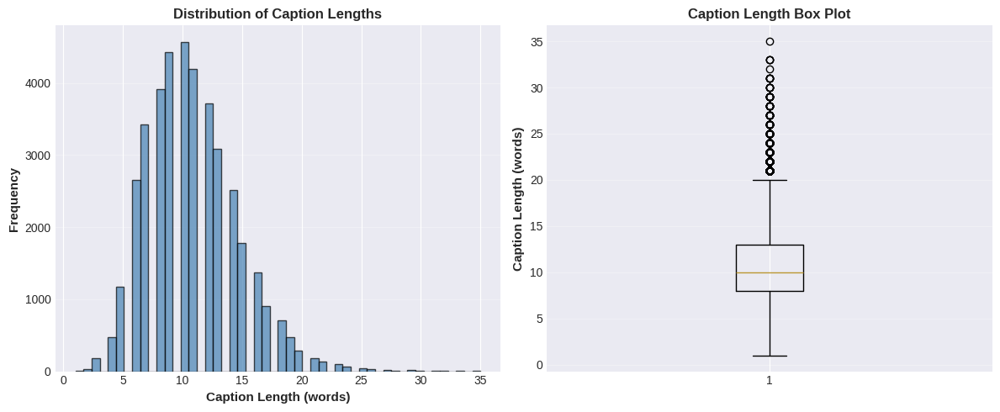


 Vocabulary saved to: /kaggle/working/vocab/vocab.pkl
 Captions dictionary saved to: /kaggle/working/vocab/captions_dict.pkl
 Word frequency saved to: /kaggle/working/vocab/word_freq.pkl

VOCABULARY BUILDING COMPLETE
 Vocabulary size: 2988
 Number of images: 8092
 Total captions: 40460
 Max caption length set to: 50 words


In [8]:
import string
from collections import Counter
import re

print("\n" + "=" * 80)
print("BUILDING VOCABULARY FOR IMAGE CAPTIONING")
print("=" * 80)

class Vocabulary:
    """Vocabulary class for managing word-to-index and index-to-word mappings"""
    
    def __init__(self, freq_threshold=5):
        self.freq_threshold = freq_threshold
        self.word2idx = {}
        self.idx2word = {}
        self.idx = 0
        
        # Special tokens
        self.pad_token = "<PAD>"
        self.start_token = "<SOS>"
        self.end_token = "<EOS>"
        self.unk_token = "<UNK>"
        
        # Add special tokens
        for token in [self.pad_token, self.start_token, self.end_token, self.unk_token]:
            self.add_word(token)
    
    def add_word(self, word):
        """Add a word to the vocabulary"""
        if word not in self.word2idx:
            self.word2idx[word] = self.idx
            self.idx2word[self.idx] = word
            self.idx += 1
    
    def __len__(self):
        return len(self.word2idx)
    
    def __call__(self, word):
        """Convert word to index"""
        if word not in self.word2idx:
            return self.word2idx[self.unk_token]
        return self.word2idx[word]
    
    def decode(self, indices):
        """Convert indices back to words"""
        return [self.idx2word[idx] for idx in indices if idx in self.idx2word]

def clean_caption(caption):
    """Clean and preprocess caption text"""
    # Convert to lowercase
    caption = caption.lower()
    
    # Remove punctuation
    caption = caption.translate(str.maketrans('', '', string.punctuation))
    
    # Remove extra whitespace
    caption = ' '.join(caption.split())
    
    # Remove numbers
    caption = re.sub(r'\d+', '', caption)
    
    return caption

def load_captions(caption_file):
    """Load and process captions from file"""
    captions_dict = {}
    
    print("\n Loading and processing captions...")
    with open(caption_file, 'r', encoding='utf-8') as f:
        lines = f.readlines()
    
    for line in tqdm(lines, desc="Processing captions"):
        line = line.strip()
        if not line:
            continue
        
        # Parse line (format: image.jpg#0	caption text)
        if '\t' in line:
            parts = line.split('\t')
            if len(parts) == 2:
                img_info, caption = parts
                img_name = img_info.split('#')[0]
                
                # Clean caption
                cleaned_caption = clean_caption(caption)
                
                if img_name not in captions_dict:
                    captions_dict[img_name] = []
                captions_dict[img_name].append(cleaned_caption)
    
    return captions_dict

def build_vocabulary(captions_dict, freq_threshold=5):
    """Build vocabulary from captions"""
    print("\n Building vocabulary...")
    
    # Count word frequencies
    word_freq = Counter()
    
    for img_name, captions in tqdm(captions_dict.items(), desc="Counting words"):
        for caption in captions:
            words = caption.split()
            word_freq.update(words)
    
    print(f"\n Total unique words before filtering: {len(word_freq)}")
    print(f" Filtering words with frequency < {freq_threshold}")
    
    # Create vocabulary
    vocab = Vocabulary(freq_threshold=freq_threshold)
    
    # Add words that meet frequency threshold
    for word, freq in word_freq.items():
        if freq >= freq_threshold:
            vocab.add_word(word)
    
    print(f" Vocabulary size after filtering: {len(vocab)}")
    
    # Show word frequency statistics
    freq_values = list(word_freq.values())
    print(f"\n Word Frequency Statistics:")
    print(f"   Min frequency: {min(freq_values)}")
    print(f"   Max frequency: {max(freq_values)}")
    print(f"   Mean frequency: {np.mean(freq_values):.2f}")
    print(f"   Median frequency: {np.median(freq_values):.2f}")
    
    # Show most common words
    print(f"\n Top 20 most common words:")
    for idx, (word, freq) in enumerate(word_freq.most_common(20), 1):
        print(f"   {idx:2d}. {word:15s}: {freq:5d} occurrences")
    
    return vocab, word_freq

# ===== LOAD AND PROCESS CAPTIONS =====
print("\n" + "─" * 80)
captions_dict = load_captions(FLICKR8K_CAPTIONS_PATH)
print(f"\n Loaded captions for {len(captions_dict)} images")

# Show sample captions
print(f"\n Sample cleaned captions:")
sample_imgs = list(captions_dict.keys())[:3]
for img_name in sample_imgs:
    print(f"\n {img_name}:")
    for idx, caption in enumerate(captions_dict[img_name][:2], 1):
        print(f"   {idx}. {caption}")

# ===== BUILD VOCABULARY =====
print("\n" + "─" * 80)
vocab, word_freq = build_vocabulary(captions_dict, 
                                     freq_threshold=CAPTION_CONFIG['min_word_freq'])

# Update config with vocabulary size
CAPTION_CONFIG['vocab_size'] = len(vocab)

# ===== ANALYZE CAPTION LENGTHS =====
print("\n" + "─" * 80)
print("\n Analyzing caption lengths...")

caption_lengths = []
for captions in captions_dict.values():
    for caption in captions:
        caption_lengths.append(len(caption.split()))

print(f"\n Caption Length Statistics:")
print(f"   Min length: {min(caption_lengths)} words")
print(f"   Max length: {max(caption_lengths)} words")
print(f"   Mean length: {np.mean(caption_lengths):.2f} words")
print(f"   Median length: {np.median(caption_lengths):.2f} words")
print(f"   95th percentile: {np.percentile(caption_lengths, 95):.0f} words")

# Visualize caption length distribution
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(caption_lengths, bins=50, color='steelblue', alpha=0.7, edgecolor='black')
plt.xlabel('Caption Length (words)', fontsize=11, weight='bold')
plt.ylabel('Frequency', fontsize=11, weight='bold')
plt.title('Distribution of Caption Lengths', fontsize=12, weight='bold')
plt.grid(axis='y', alpha=0.3)

plt.subplot(1, 2, 2)
plt.boxplot(caption_lengths, vert=True)
plt.ylabel('Caption Length (words)', fontsize=11, weight='bold')
plt.title('Caption Length Box Plot', fontsize=12, weight='bold')
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(PLOTS_DIR, 'caption_length_distribution.png'), 
            dpi=100, bbox_inches='tight')
print(f"\n Distribution plot saved to: {PLOTS_DIR}/caption_length_distribution.png")
plt.show()

# ===== SAVE VOCABULARY =====
vocab_path = os.path.join(VOCAB_DIR, 'vocab.pkl')
with open(vocab_path, 'wb') as f:
    pickle.dump(vocab, f)
print(f"\n Vocabulary saved to: {vocab_path}")

# Save captions dictionary
captions_path = os.path.join(VOCAB_DIR, 'captions_dict.pkl')
with open(captions_path, 'wb') as f:
    pickle.dump(captions_dict, f)
print(f" Captions dictionary saved to: {captions_path}")

# Save word frequency
word_freq_path = os.path.join(VOCAB_DIR, 'word_freq.pkl')
with open(word_freq_path, 'wb') as f:
    pickle.dump(word_freq, f)
print(f" Word frequency saved to: {word_freq_path}")

print("\n" + "=" * 80)
print("VOCABULARY BUILDING COMPLETE")
print("=" * 80)
print(f" Vocabulary size: {len(vocab)}")
print(f" Number of images: {len(captions_dict)}")
print(f" Total captions: {sum(len(caps) for caps in captions_dict.values())}")
print(f" Max caption length set to: {CAPTION_CONFIG['max_caption_length']} words")
print("=" * 80)

In [9]:
from torch.utils.data import Dataset
from torchvision import transforms
import torch.nn.functional as F

# ===== IMAGE CAPTIONING DATASET =====
class Flickr8kDataset(Dataset):    
    def __init__(self, image_dir, captions_dict, vocab, image_list=None, 
                 transform=None, max_length=50):
        """
        Args:
            image_dir: Directory containing images
            captions_dict: Dictionary mapping image names to captions
            vocab: Vocabulary object
            image_list: List of image names to include (for train/val/test split)
            transform: Image transformations
            max_length: Maximum caption length
        """
        self.image_dir = image_dir
        self.captions_dict = captions_dict
        self.vocab = vocab
        self.transform = transform
        self.max_length = max_length
        
        # Filter images if image_list is provided
        if image_list is not None:
            self.images = [img for img in image_list if img in captions_dict]
        else:
            self.images = list(captions_dict.keys())
        
        # Create list of (image, caption) pairs
        self.data = []
        for img_name in self.images:
            for caption in captions_dict[img_name]:
                self.data.append((img_name, caption))
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        img_name, caption = self.data[idx]
        img_path = os.path.join(self.image_dir, img_name)
        
        # Load and transform image
        try:
            image = Image.open(img_path).convert('RGB')
        except:
            # If image fails to load, return a black image
            image = Image.new('RGB', (224, 224), color='black')
        
        if self.transform:
            image = self.transform(image)
        
        # Convert caption to indices
        caption_tokens = caption.split()
        caption_indices = [self.vocab(self.vocab.start_token)]
        caption_indices.extend([self.vocab(token) for token in caption_tokens])
        caption_indices.append(self.vocab(self.vocab.end_token))
        
        # Pad or truncate to max_length
        if len(caption_indices) > self.max_length:
            caption_indices = caption_indices[:self.max_length]
        
        # Get actual length before padding
        caption_length = len(caption_indices)
        
        # Pad caption
        caption_indices.extend([self.vocab(self.vocab.pad_token)] * 
                              (self.max_length - len(caption_indices)))
        
        return image, torch.tensor(caption_indices), caption_length

# ===== ACTION RECOGNITION DATASET =====
class ActionRecognitionDataset(Dataset):
    
    def __init__(self, data_dir, class_names, transform=None):
        """
        Args:
            data_dir: Directory containing class folders
            class_names: List of class names
            transform: Image transformations
        """
        self.data_dir = data_dir
        self.class_names = sorted(class_names)
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.class_names)}
        self.transform = transform
        
        # Load all image paths and labels
        self.samples = []
        
        for class_name in self.class_names:
            class_dir = os.path.join(data_dir, class_name)
            if not os.path.exists(class_dir):
                continue
            
            image_files = [f for f in os.listdir(class_dir) 
                          if f.endswith(('.jpg', '.png', '.jpeg', '.JPG', '.PNG', '.JPEG'))]
            
            for img_file in image_files:
                img_path = os.path.join(class_dir, img_file)
                label = self.class_to_idx[class_name]
                self.samples.append((img_path, label))
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        
        # Load and transform image
        try:
            image = Image.open(img_path).convert('RGB')
        except:
            # If image fails to load, return a black image
            image = Image.new('RGB', (224, 224), color='black')
        
        if self.transform:
            image = self.transform(image)
        
        return image, label

# ===== DEFINE TRANSFORMS =====
print("\n Defining data transformations...")

# Training transforms with augmentation
train_transform_caption = transforms.Compose([
    transforms.Resize((CAPTION_CONFIG['image_size'], CAPTION_CONFIG['image_size'])),
    transforms.RandomCrop(CAPTION_CONFIG['crop_size']),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                        std=[0.229, 0.224, 0.225])
])

# Validation/Test transforms (no augmentation)
val_transform_caption = transforms.Compose([
    transforms.Resize((CAPTION_CONFIG['crop_size'], CAPTION_CONFIG['crop_size'])),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                        std=[0.229, 0.224, 0.225])
])

# Training transforms for action recognition (more aggressive augmentation)
train_transform_action = transforms.Compose([
    transforms.Resize((ACTION_CONFIG['image_size'], ACTION_CONFIG['image_size'])),
    transforms.RandomCrop(ACTION_CONFIG['crop_size']),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                        std=[0.229, 0.224, 0.225])
])

# Validation/Test transforms for action recognition
val_transform_action = transforms.Compose([
    transforms.Resize((ACTION_CONFIG['crop_size'], ACTION_CONFIG['crop_size'])),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                        std=[0.229, 0.224, 0.225])
])

print(" Transforms defined:")
print("   - Training: Resize, RandomCrop, HorizontalFlip, ColorJitter, Normalize")
print("   - Validation: Resize, Normalize")

# ===== LOAD TRAIN/VAL/TEST SPLITS FOR FLICKR8K =====
print("\n Loading Flickr8k splits...")

with open(FLICKR8K_TRAIN_IMAGES, 'r') as f:
    train_images = [line.strip() for line in f.readlines()]

with open(FLICKR8K_DEV_IMAGES, 'r') as f:
    val_images = [line.strip() for line in f.readlines()]

with open(FLICKR8K_TEST_IMAGES, 'r') as f:
    test_images = [line.strip() for line in f.readlines()]

print(f" Train images: {len(train_images)}")
print(f" Validation images: {len(val_images)}")
print(f" Test images: {len(test_images)}")

print("DATASET CLASSES CREATED SUCCESSFULLY")


 Defining data transformations...
 Transforms defined:
   - Training: Resize, RandomCrop, HorizontalFlip, ColorJitter, Normalize
   - Validation: Resize, Normalize

 Loading Flickr8k splits...
 Train images: 6000
 Validation images: 1000
 Test images: 1000
DATASET CLASSES CREATED SUCCESSFULLY


In [10]:
print("CREATING DATA LOADERS")

# ===== CUSTOM COLLATE FUNCTION FOR CAPTIONING =====
def collate_fn_caption(batch):
    """Custom collate function to handle variable length captions"""
    images, captions, lengths = zip(*batch)
    
    images = torch.stack(images, 0)
    captions = torch.stack(captions, 0)
    lengths = torch.tensor(lengths)
    
    return images, captions, lengths

# ===== CREATE FLICKR8K DATASETS =====
print("\n Creating Flickr8k datasets...")

train_dataset_caption = Flickr8kDataset(
    image_dir=FLICKR8K_IMAGES_PATH,
    captions_dict=captions_dict,
    vocab=vocab,
    image_list=train_images,
    transform=train_transform_caption,
    max_length=CAPTION_CONFIG['max_caption_length']
)

val_dataset_caption = Flickr8kDataset(
    image_dir=FLICKR8K_IMAGES_PATH,
    captions_dict=captions_dict,
    vocab=vocab,
    image_list=val_images,
    transform=val_transform_caption,
    max_length=CAPTION_CONFIG['max_caption_length']
)

test_dataset_caption = Flickr8kDataset(
    image_dir=FLICKR8K_IMAGES_PATH,
    captions_dict=captions_dict,
    vocab=vocab,
    image_list=test_images,
    transform=val_transform_caption,
    max_length=CAPTION_CONFIG['max_caption_length']
)

print(f" Train dataset: {len(train_dataset_caption)} samples")
print(f" Validation dataset: {len(val_dataset_caption)} samples")
print(f" Test dataset: {len(test_dataset_caption)} samples")

# ===== CREATE ACTION RECOGNITION DATASETS =====
print("\n Creating Action Recognition datasets...")

train_dataset_action = ActionRecognitionDataset(
    data_dir=ACTION_TRAIN_PATH,
    class_names=ACTION_CONFIG['class_names'],
    transform=train_transform_action
)

test_dataset_action = ActionRecognitionDataset(
    data_dir=ACTION_TEST_PATH,
    class_names=ACTION_CONFIG['class_names'],
    transform=val_transform_action
)

# Create validation split from training data (10% of train)
train_size_action = int(0.9 * len(train_dataset_action))
val_size_action = len(train_dataset_action) - train_size_action

train_dataset_action, val_dataset_action = torch.utils.data.random_split(
    train_dataset_action,
    [train_size_action, val_size_action],
    generator=torch.Generator().manual_seed(SEED)
)

print(f" Train dataset: {len(train_dataset_action)} samples")
print(f" Validation dataset: {len(val_dataset_action)} samples")
print(f" Test dataset: {len(test_dataset_action)} samples")

# ===== CREATE DATA LOADERS FOR CAPTIONING =====
print("\n" + "─" * 80)
print(" Creating Flickr8k data loaders...")

train_loader_caption = DataLoader(
    train_dataset_caption,
    batch_size=CAPTION_CONFIG['batch_size'],
    shuffle=True,
    num_workers=SHARED_CONFIG['num_workers'],
    pin_memory=SHARED_CONFIG['pin_memory'],
    collate_fn=collate_fn_caption
)

val_loader_caption = DataLoader(
    val_dataset_caption,
    batch_size=CAPTION_CONFIG['batch_size'],
    shuffle=False,
    num_workers=SHARED_CONFIG['num_workers'],
    pin_memory=SHARED_CONFIG['pin_memory'],
    collate_fn=collate_fn_caption
)

test_loader_caption = DataLoader(
    test_dataset_caption,
    batch_size=CAPTION_CONFIG['batch_size'],
    shuffle=False,
    num_workers=SHARED_CONFIG['num_workers'],
    pin_memory=SHARED_CONFIG['pin_memory'],
    collate_fn=collate_fn_caption
)

print(f" Train loader: {len(train_loader_caption)} batches")
print(f" Validation loader: {len(val_loader_caption)} batches")
print(f" Test loader: {len(test_loader_caption)} batches")

# ===== CREATE DATA LOADERS FOR ACTION RECOGNITION =====
print("\n" + "─" * 80)
print(" Creating Action Recognition data loaders...")

train_loader_action = DataLoader(
    train_dataset_action,
    batch_size=ACTION_CONFIG['batch_size'],
    shuffle=True,
    num_workers=SHARED_CONFIG['num_workers'],
    pin_memory=SHARED_CONFIG['pin_memory']
)

val_loader_action = DataLoader(
    val_dataset_action,
    batch_size=ACTION_CONFIG['batch_size'],
    shuffle=False,
    num_workers=SHARED_CONFIG['num_workers'],
    pin_memory=SHARED_CONFIG['pin_memory']
)

test_loader_action = DataLoader(
    test_dataset_action,
    batch_size=ACTION_CONFIG['batch_size'],
    shuffle=False,
    num_workers=SHARED_CONFIG['num_workers'],
    pin_memory=SHARED_CONFIG['pin_memory']
)

print(f" Train loader: {len(train_loader_action)} batches")
print(f" Validation loader: {len(val_loader_action)} batches")
print(f" Test loader: {len(test_loader_action)} batches")

# ===== TEST DATA LOADERS =====
print("TESTING DATA LOADERS")

print("\n Testing Flickr8k loader...")
images, captions, lengths = next(iter(train_loader_caption))
print(f" Batch shape - Images: {images.shape}, Captions: {captions.shape}, Lengths: {lengths.shape}")
print(f" Sample caption indices: {captions[0][:20]}")
print(f" Sample caption length: {lengths[0]}")

print("\n Testing Action Recognition loader...")
images, labels = next(iter(train_loader_action))
print(f" Batch shape - Images: {images.shape}, Labels: {labels.shape}")
print(f" Sample labels: {labels[:10]}")
print(f" Unique labels in batch: {torch.unique(labels).tolist()}")

print("DATA LOADERS CREATED SUCCESSFULLY")
print("\nSummary:")
print(f"  • Flickr8k: {len(train_loader_caption)} train batches, {len(val_loader_caption)} val batches")
print(f"  • Action Recognition: {len(train_loader_action)} train batches, {len(val_loader_action)} val batches")
print(f"  • All loaders tested and working correctly")
print("=" * 80)

CREATING DATA LOADERS

 Creating Flickr8k datasets...
 Train dataset: 30000 samples
 Validation dataset: 5000 samples
 Test dataset: 5000 samples

 Creating Action Recognition datasets...
 Train dataset: 9639 samples
 Validation dataset: 1071 samples
 Test dataset: 1890 samples

────────────────────────────────────────────────────────────────────────────────
 Creating Flickr8k data loaders...
 Train loader: 469 batches
 Validation loader: 79 batches
 Test loader: 79 batches

────────────────────────────────────────────────────────────────────────────────
 Creating Action Recognition data loaders...
 Train loader: 302 batches
 Validation loader: 34 batches
 Test loader: 60 batches
TESTING DATA LOADERS

 Testing Flickr8k loader...
 Batch shape - Images: torch.Size([64, 3, 224, 224]), Captions: torch.Size([64, 50]), Lengths: torch.Size([64])
 Sample caption indices: tensor([  1,   4,  22, 140,  34,   6,  24, 135,   2,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0])
 Sample

In [12]:
import torch.nn as nn
from torchvision import models

print("BUILDING IMAGE CAPTIONING MODEL (CNN + LSTM)")

class EncoderCNN(nn.Module):
    """CNN Encoder using pre-trained ResNet50"""
    
    def __init__(self, embed_size):
        super(EncoderCNN, self).__init__()
        
        # Load pre-trained ResNet50
        resnet = models.resnet50(pretrained=True)
        
        # Remove the last fully connected layer
        modules = list(resnet.children())[:-1]
        self.resnet = nn.Sequential(*modules)
        
        # Add new fully connected layer to map to embedding size
        self.fc = nn.Linear(resnet.fc.in_features, embed_size)
        self.bn = nn.BatchNorm1d(embed_size, momentum=0.01)
        
        # Freeze ResNet parameters (we'll fine-tune only the FC layer)
        for param in self.resnet.parameters():
            param.requires_grad = False
    
    def forward(self, images):
        """
        Args:
            images: (batch_size, 3, 224, 224)
        Returns:
            features: (batch_size, embed_size)
        """
        with torch.no_grad():
            features = self.resnet(images)
        
        features = features.view(features.size(0), -1)
        features = self.fc(features)
        features = self.bn(features)
        
        return features

class DecoderLSTM(nn.Module):
    """LSTM Decoder for generating captions"""
    
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers, dropout=0.5):
        super(DecoderLSTM, self).__init__()
        
        self.embed_size = embed_size
        self.hidden_size = hidden_size
        self.vocab_size = vocab_size
        self.num_layers = num_layers
        
        # Embedding layer
        self.embed = nn.Embedding(vocab_size, embed_size)
        
        # LSTM layers
        self.lstm = nn.LSTM(
            embed_size,
            hidden_size,
            num_layers,
            batch_first=True,
            dropout=dropout if num_layers > 1 else 0
        )
        
        # Dropout layer
        self.dropout = nn.Dropout(dropout)
        
        # Fully connected layer to map LSTM output to vocabulary
        self.fc = nn.Linear(hidden_size, vocab_size)
    
    def forward(self, features, captions, lengths):
        """
        Args:
            features: (batch_size, embed_size)
            captions: (batch_size, max_length)
            lengths: (batch_size)
        """
        # Embed captions
        embeddings = self.embed(captions)
        
        # Concatenate image features with caption embeddings
        features = features.unsqueeze(1)
        embeddings = torch.cat((features, embeddings), dim=1)
        
        # Remove the last time step
        embeddings = embeddings[:, :-1, :]
        
        # Pack padded sequences
        packed = nn.utils.rnn.pack_padded_sequence(
            embeddings, 
            lengths.cpu(), 
            batch_first=True, 
            enforce_sorted=False
        )
        
        # Forward through LSTM
        hiddens, _ = self.lstm(packed)
        
        # --- THE FIX IS HERE ---
        # We explicitly tell pad_packed_sequence to output the exact length 
        # of the original 'captions' tensor. This ensures all GPUs return 
        # the same shape (e.g., [32, 2988, hidden]) even if valid data is shorter.
        total_length = captions.size(1)
        
        hiddens, _ = nn.utils.rnn.pad_packed_sequence(
            hiddens, 
            batch_first=True, 
            total_length=total_length  # <--- FORCE FIXED LENGTH
        )
        
        # Apply dropout
        hiddens = self.dropout(hiddens)
        
        # Map to vocabulary size
        outputs = self.fc(hiddens)
        
        return outputs
    
    def sample(self, features, max_length=50):
        """
        Generate captions using greedy search (for inference)
        """
        # (This method remains unchanged from your original code)
        batch_size = features.size(0)
        captions = []
        states = None
        inputs = features.unsqueeze(1)
        
        for _ in range(max_length):
            hiddens, states = self.lstm(inputs, states)
            outputs = self.fc(hiddens.squeeze(1))
            predicted = outputs.argmax(dim=1)
            captions.append(predicted)
            inputs = self.embed(predicted).unsqueeze(1)
        
        captions = torch.stack(captions, dim=1)
        return captions


class ImageCaptioningModel(nn.Module):
    """Complete Image Captioning Model (Encoder + Decoder)"""
    
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers, dropout=0.5):
        super(ImageCaptioningModel, self).__init__()
        
        self.encoder = EncoderCNN(embed_size)
        self.decoder = DecoderLSTM(embed_size, hidden_size, vocab_size, num_layers, dropout)
    
    def forward(self, images, captions, lengths):
        """
        Forward pass for training
        """
        features = self.encoder(images)
        outputs = self.decoder(features, captions, lengths)
        return outputs
    
    def generate_caption(self, images, max_length=50):
        """
        Generate captions for given images (inference)
        """
        features = self.encoder(images)
        captions = self.decoder.sample(features, max_length)
        return captions

# ===== CREATE MODEL =====
print("\n Creating Image Captioning Model...")

caption_model = ImageCaptioningModel(
    embed_size=CAPTION_CONFIG['embed_size'],
    hidden_size=CAPTION_CONFIG['hidden_size'],
    vocab_size=CAPTION_CONFIG['vocab_size'],
    num_layers=CAPTION_CONFIG['num_layers'],
    dropout=CAPTION_CONFIG['dropout']
)

# Move to device
caption_model = caption_model.to(device)

# Use DataParallel for multi-GPU
if USE_MULTI_GPU:
    caption_model = nn.DataParallel(caption_model)
    print(f" Model wrapped with DataParallel for {n_gpus} GPUs")

# ===== MODEL SUMMARY =====
print("\n" + "─" * 80)
print("MODEL ARCHITECTURE SUMMARY")
print("─" * 80)

def count_parameters(model):
    """Count trainable and total parameters"""
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total_params, trainable_params

total_params, trainable_params = count_parameters(caption_model)

print(f"\nModel Configuration:")
print(f"  Embedding size: {CAPTION_CONFIG['embed_size']}")
print(f"  Hidden size: {CAPTION_CONFIG['hidden_size']}")
print(f"  Vocabulary size: {CAPTION_CONFIG['vocab_size']}")
print(f"  Number of LSTM layers: {CAPTION_CONFIG['num_layers']}")
print(f"  Dropout: {CAPTION_CONFIG['dropout']}")

print(f"\nModel Parameters:")
print(f"  Total parameters: {total_params:,}")
print(f"  Trainable parameters: {trainable_params:,}")
print(f"  Non-trainable parameters: {total_params - trainable_params:,}")
print(f"  Model size: {total_params * 4 / (1024**2):.2f} MB (float32)")

# ===== TEST MODEL =====
print("\n" + "─" * 80)
print("Testing model with sample batch...")

caption_model.eval()
with torch.no_grad():
    sample_images, sample_captions, sample_lengths = next(iter(train_loader_caption))
    sample_images = sample_images.to(device)
    sample_captions = sample_captions.to(device)
    
    # Test forward pass
    outputs = caption_model(sample_images, sample_captions, sample_lengths)
    print(f"  Forward pass successful")
    print(f"  Input shape: {sample_images.shape}")
    print(f"  Output shape: {outputs.shape}")
    print(f"  Expected shape: (batch_size, max_length, vocab_size)")
    
    # Test caption generation
    generated = caption_model.module.generate_caption(sample_images[:4], max_length=20) if USE_MULTI_GPU else caption_model.generate_caption(sample_images[:4], max_length=20)
    print(f"\n Caption generation successful")
    print(f"  Generated shape: {generated.shape}")
    
    # Decode one generated caption
    sample_generated = generated[0].cpu().numpy()
    decoded_caption = vocab.decode(sample_generated)
    print(f"  Sample generated caption: {' '.join(decoded_caption[:10])}...")

caption_model.train()
print("IMAGE CAPTIONING MODEL CREATED SUCCESSFULLY")


BUILDING IMAGE CAPTIONING MODEL (CNN + LSTM)

 Creating Image Captioning Model...
 Model wrapped with DataParallel for 2 GPUs

────────────────────────────────────────────────────────────────────────────────
MODEL ARCHITECTURE SUMMARY
────────────────────────────────────────────────────────────────────────────────

Model Configuration:
  Embedding size: 256
  Hidden size: 512
  Vocabulary size: 2988
  Number of LSTM layers: 2
  Dropout: 0.5

Model Parameters:
  Total parameters: 30,009,068
  Trainable parameters: 6,501,036
  Non-trainable parameters: 23,508,032
  Model size: 114.48 MB (float32)

────────────────────────────────────────────────────────────────────────────────
Testing model with sample batch...
  Forward pass successful
  Input shape: torch.Size([64, 3, 224, 224])
  Output shape: torch.Size([64, 50, 2988])
  Expected shape: (batch_size, max_length, vocab_size)

 Caption generation successful
  Generated shape: torch.Size([4, 20])
  Sample generated caption: onlookers fes

In [13]:
print("BUILDING ACTION RECOGNITION MODEL (CNN CLASSIFIER)")

class ActionRecognitionModel(nn.Module):
    """Action Recognition Model using pre-trained ResNet50"""
    
    def __init__(self, num_classes, dropout=0.5, freeze_backbone=False):
        super(ActionRecognitionModel, self).__init__()
        
        # Load pre-trained ResNet50
        self.backbone = models.resnet50(pretrained=True)
        
        # Optionally freeze backbone
        if freeze_backbone:
            for param in self.backbone.parameters():
                param.requires_grad = False
        
        # Get number of features from backbone
        num_features = self.backbone.fc.in_features
        
        # Replace the final fully connected layer
        self.backbone.fc = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(num_features, 512),
            nn.ReLU(),
            nn.BatchNorm1d(512),
            nn.Dropout(dropout),
            nn.Linear(512, num_classes)
        )
    
    def forward(self, x):
        """
        Args:
            x: (batch_size, 3, 224, 224)
        Returns:
            outputs: (batch_size, num_classes)
        """
        return self.backbone(x)

# ===== CREATE MODEL =====
print("\n Creating Action Recognition Model...")

action_model = ActionRecognitionModel(
    num_classes=ACTION_CONFIG['num_classes'],
    dropout=ACTION_CONFIG['dropout'],
    freeze_backbone=ACTION_CONFIG['freeze_backbone']
)

# Move to device
action_model = action_model.to(device)

# Use DataParallel for multi-GPU
if USE_MULTI_GPU:
    action_model = nn.DataParallel(action_model)
    print(f" Model wrapped with DataParallel for {n_gpus} GPUs")

# ===== MODEL SUMMARY =====
print("MODEL ARCHITECTURE SUMMARY")

total_params, trainable_params = count_parameters(action_model)

print(f"\nModel Configuration:")
print(f"  Backbone: ResNet50 (pre-trained on ImageNet)")
print(f"  Number of classes: {ACTION_CONFIG['num_classes']}")
print(f"  Dropout: {ACTION_CONFIG['dropout']}")
print(f"  Freeze backbone: {ACTION_CONFIG['freeze_backbone']}")

print(f"\nModel Parameters:")
print(f"  Total parameters: {total_params:,}")
print(f"  Trainable parameters: {trainable_params:,}")
print(f"  Non-trainable parameters: {total_params - trainable_params:,}")
print(f"  Model size: {total_params * 4 / (1024**2):.2f} MB (float32)")

print(f"\nClass Names:")
for idx, class_name in enumerate(ACTION_CONFIG['class_names']):
    print(f"  {idx:2d}. {class_name}")

# ===== TEST MODEL =====
print("\n" + "─" * 80)
print("Testing model with sample batch...")

action_model.eval()
with torch.no_grad():
    sample_images, sample_labels = next(iter(train_loader_action))
    sample_images = sample_images.to(device)
    sample_labels = sample_labels.to(device)
    
    # Test forward pass
    outputs = action_model(sample_images)
    print(f" Forward pass successful")
    print(f"  Input shape: {sample_images.shape}")
    print(f"  Output shape: {outputs.shape}")
    print(f"  Expected shape: (batch_size, num_classes)")
    
    # Get predictions
    _, predictions = outputs.max(dim=1)
    accuracy = (predictions == sample_labels).float().mean()
    
    print(f"\n Predictions generated")
    print(f"  Sample predictions: {predictions[:10].cpu().numpy()}")
    print(f"  Sample labels: {sample_labels[:10].cpu().numpy()}")
    print(f"  Random accuracy (untrained): {accuracy.item():.4f}")

action_model.train()

print("ACTION RECOGNITION MODEL CREATED SUCCESSFULLY")

# ===== SUMMARY =====
print("\n" + "=" * 80)
print("MODELS SUMMARY")
print("=" * 80)
print("\n Image Captioning Model:")
print(f"   - Encoder: ResNet50 (frozen)")
print(f"   - Decoder: {CAPTION_CONFIG['num_layers']}-layer LSTM")
print(f"   - Parameters: {trainable_params:,} trainable")

total_params_action, trainable_params_action = count_parameters(action_model)
print("\n Action Recognition Model:")
print(f"   - Backbone: ResNet50 (fine-tuned)")
print(f"   - Classifier: 2-layer MLP")
print(f"   - Parameters: {trainable_params_action:,} trainable")

print("\n Both models ready for training!")

BUILDING ACTION RECOGNITION MODEL (CNN CLASSIFIER)

 Creating Action Recognition Model...
 Model wrapped with DataParallel for 2 GPUs
MODEL ARCHITECTURE SUMMARY

Model Configuration:
  Backbone: ResNet50 (pre-trained on ImageNet)
  Number of classes: 15
  Dropout: 0.5
  Freeze backbone: False

Model Parameters:
  Total parameters: 24,565,839
  Trainable parameters: 24,565,839
  Non-trainable parameters: 0
  Model size: 93.71 MB (float32)

Class Names:
   0. calling
   1. clapping
   2. cycling
   3. dancing
   4. drinking
   5. eating
   6. fighting
   7. hugging
   8. laughing
   9. listening_to_music
  10. running
  11. sitting
  12. sleeping
  13. texting
  14. using_laptop

────────────────────────────────────────────────────────────────────────────────
Testing model with sample batch...
 Forward pass successful
  Input shape: torch.Size([32, 3, 224, 224])
  Output shape: torch.Size([32, 15])
  Expected shape: (batch_size, num_classes)

 Predictions generated
  Sample predictions: 

In [14]:
class AverageMeter:
    """Computes and stores the average and current value"""
    
    def __init__(self):
        self.reset()
    
    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0
    
    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

class EarlyStopping:
    """Early stopping to stop training when validation loss doesn't improve"""
    
    def __init__(self, patience=5, min_delta=0, verbose=True):
        self.patience = patience
        self.min_delta = min_delta
        self.verbose = verbose
        self.counter = 0
        self.best_loss = None
        self.early_stop = False
        self.best_epoch = 0
    
    def __call__(self, val_loss, epoch):
        if self.best_loss is None:
            self.best_loss = val_loss
            self.best_epoch = epoch
        elif val_loss > self.best_loss - self.min_delta:
            self.counter += 1
            if self.verbose:
                print(f'   EarlyStopping counter: {self.counter}/{self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_loss = val_loss
            self.best_epoch = epoch
            self.counter = 0

def save_checkpoint(model, optimizer, epoch, loss, accuracy, filepath, is_best=False):
    """Save model checkpoint"""
    
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.module.state_dict() if isinstance(model, nn.DataParallel) else model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss,
        'accuracy': accuracy
    }
    
    torch.save(checkpoint, filepath)
    
    if is_best:
        best_filepath = filepath.replace('.pth', '_best.pth')
        torch.save(checkpoint, best_filepath)

def load_checkpoint(model, optimizer, filepath):
    """Load model checkpoint"""
    
    checkpoint = torch.load(filepath)
    
    if isinstance(model, nn.DataParallel):
        model.module.load_state_dict(checkpoint['model_state_dict'])
    else:
        model.load_state_dict(checkpoint['model_state_dict'])
    
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint['epoch']
    loss = checkpoint['loss']
    accuracy = checkpoint.get('accuracy', 0)
    
    return epoch, loss, accuracy

def plot_training_history(history, save_path, title='Training History'):
    """Plot training and validation metrics"""
    
    epochs = range(1, len(history['train_loss']) + 1)
    
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    # Plot loss
    axes[0].plot(epochs, history['train_loss'], 'b-o', label='Train Loss', linewidth=2, markersize=6)
    axes[0].plot(epochs, history['val_loss'], 'r-s', label='Val Loss', linewidth=2, markersize=6)
    axes[0].set_xlabel('Epoch', fontsize=12, weight='bold')
    axes[0].set_ylabel('Loss', fontsize=12, weight='bold')
    axes[0].set_title('Loss Curves', fontsize=13, weight='bold')
    axes[0].legend(fontsize=11)
    axes[0].grid(True, alpha=0.3)
    
    # Plot accuracy (if available)
    if 'train_acc' in history and 'val_acc' in history:
        axes[1].plot(epochs, history['train_acc'], 'b-o', label='Train Acc', linewidth=2, markersize=6)
        axes[1].plot(epochs, history['val_acc'], 'r-s', label='Val Acc', linewidth=2, markersize=6)
        axes[1].set_xlabel('Epoch', fontsize=12, weight='bold')
        axes[1].set_ylabel('Accuracy (%)', fontsize=12, weight='bold')
        axes[1].set_title('Accuracy Curves', fontsize=13, weight='bold')
        axes[1].legend(fontsize=11)
        axes[1].grid(True, alpha=0.3)
    
    plt.suptitle(title, fontsize=14, weight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(save_path, dpi=100, bbox_inches='tight')
    plt.close()

print("\n AverageMeter class defined")
print(" EarlyStopping class defined")
print(" save_checkpoint function defined")
print(" load_checkpoint function defined")
print(" plot_training_history function defined")

print("TRAINING HELPER FUNCTIONS READY")


 AverageMeter class defined
 EarlyStopping class defined
 save_checkpoint function defined
 load_checkpoint function defined
 plot_training_history function defined
TRAINING HELPER FUNCTIONS READY


In [16]:
print("TRAINING IMAGE CAPTIONING MODEL")

def train_caption_epoch(model, train_loader, criterion, optimizer, device, epoch):
    """Train for one epoch"""
    model.train()
    
    losses = AverageMeter()
    
    # Progress bar
    pbar = tqdm(train_loader, desc=f'Epoch {epoch} [Train]', leave=False)
    
    for batch_idx, (images, captions, lengths) in enumerate(pbar):
        # Move to device
        images = images.to(device)
        captions = captions.to(device)
        
        # Zero gradients
        optimizer.zero_grad()
        
        # Forward pass
        outputs = model(images, captions, lengths)
        
        # Calculate loss (ignore padding tokens)
        # Reshape for loss calculation
        outputs = outputs.reshape(-1, outputs.shape[2])  # (batch * seq_len, vocab_size)
        targets = captions.reshape(-1)  # (batch * seq_len)
        
        loss = criterion(outputs, targets)
        
        # Backward pass
        loss.backward()
        
        # Clip gradients
        torch.nn.utils.clip_grad_norm_(model.parameters(), CAPTION_CONFIG['grad_clip'])
        
        # Update weights
        optimizer.step()
        
        # Update metrics
        losses.update(loss.item(), images.size(0))
        
        # Update progress bar
        pbar.set_postfix({
            'loss': f'{losses.avg:.4f}',
            'batch_loss': f'{loss.item():.4f}'
        })
    
    return losses.avg

def validate_caption_epoch(model, val_loader, criterion, device, epoch):
    """Validate for one epoch"""
    model.eval()
    
    losses = AverageMeter()
    
    # Progress bar
    pbar = tqdm(val_loader, desc=f'Epoch {epoch} [Val]', leave=False)
    
    with torch.no_grad():
        for images, captions, lengths in pbar:
            # Move to device
            images = images.to(device)
            captions = captions.to(device)
            
            # Forward pass
            outputs = model(images, captions, lengths)
            
            # Calculate loss
            outputs = outputs.reshape(-1, outputs.shape[2])
            targets = captions.reshape(-1)
            
            loss = criterion(outputs, targets)
            
            # Update metrics
            losses.update(loss.item(), images.size(0))
            
            # Update progress bar
            pbar.set_postfix({'loss': f'{losses.avg:.4f}'})
    
    return losses.avg

# ===== SETUP TRAINING =====
print("\n Setting up training...")

# Loss function (ignore padding index)
criterion_caption = nn.CrossEntropyLoss(ignore_index=vocab(vocab.pad_token)).to(device)

# Optimizer
optimizer_caption = optim.Adam(
    caption_model.parameters(),
    lr=CAPTION_CONFIG['learning_rate']
)

# Learning rate scheduler
scheduler_caption = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_caption,
    mode='min',
    factor=0.5,
    patience=2,
    # verbose=True
)

# Early stopping
early_stopping_caption = EarlyStopping(
    patience=SHARED_CONFIG['patience'],
    verbose=True
)

print(f" Loss function: CrossEntropyLoss (ignore_index={vocab(vocab.pad_token)})")
print(f" Optimizer: Adam (lr={CAPTION_CONFIG['learning_rate']})")
print(f" Scheduler: ReduceLROnPlateau (factor=0.5, patience=2)")
print(f" Early stopping patience: {SHARED_CONFIG['patience']} epochs")

# ===== TRAINING LOOP =====
print("\n" + "=" * 80)
print("STARTING TRAINING - IMAGE CAPTIONING")
print("=" * 80)

history_caption = {
    'train_loss': [],
    'val_loss': []
}

best_val_loss = float('inf')

for epoch in range(1, CAPTION_CONFIG['num_epochs'] + 1):
    print(f"\n{'='*80}")
    print(f"EPOCH {epoch}/{CAPTION_CONFIG['num_epochs']}")
    print(f"{'='*80}")
    
    # Train
    train_loss = train_caption_epoch(
        caption_model,
        train_loader_caption,
        criterion_caption,
        optimizer_caption,
        device,
        epoch
    )
    
    # Validate
    val_loss = validate_caption_epoch(
        caption_model,
        val_loader_caption,
        criterion_caption,
        device,
        epoch
    )
    
    # Update history
    history_caption['train_loss'].append(train_loss)
    history_caption['val_loss'].append(val_loss)
    
    # Print epoch summary
    print(f"\nEpoch {epoch} Summary:")
    print(f"  Train Loss: {train_loss:.4f}")
    print(f"  Val Loss:   {val_loss:.4f}")
    
    # Learning rate scheduling
    scheduler_caption.step(val_loss)
    current_lr = optimizer_caption.param_groups[0]['lr']
    print(f"  Learning Rate: {current_lr:.6f}")
    
    # Save checkpoint
    is_best = val_loss < best_val_loss
    if is_best:
        best_val_loss = val_loss
        print(f"   New best model! (Val Loss: {val_loss:.4f})")
    
    checkpoint_path = os.path.join(
        CHECKPOINTS_DIR,
        f'caption_model_epoch_{epoch}.pth'
    )
    
    save_checkpoint(
        caption_model,
        optimizer_caption,
        epoch,
        val_loss,
        0,  # No accuracy for captioning
        checkpoint_path,
        is_best=is_best
    )
    
    print(f"   Checkpoint saved: {checkpoint_path}")
    
    # Early stopping check
    early_stopping_caption(val_loss, epoch)
    if early_stopping_caption.early_stop:
        print(f"\n Early stopping triggered at epoch {epoch}")
        print(f"  Best epoch: {early_stopping_caption.best_epoch}")
        print(f"  Best val loss: {early_stopping_caption.best_loss:.4f}")
        break
    
    # Plot training history
    if epoch % SHARED_CONFIG['save_frequency'] == 0 or is_best:
        plot_path = os.path.join(PLOTS_DIR, 'caption_training_history.png')
        plot_training_history(
            history_caption,
            plot_path,
            title='Image Captioning - Training History'
        )

# ===== TRAINING COMPLETE =====
print("\n\nIMAGE CAPTIONING TRAINING COMPLETE")
print(f" Total epochs trained: {len(history_caption['train_loss'])}")
print(f" Best validation loss: {best_val_loss:.4f}")
print(f" Final training loss: {history_caption['train_loss'][-1]:.4f}")
print(f" Final validation loss: {history_caption['val_loss'][-1]:.4f}")

# Save final training history
history_path = os.path.join(RESULTS_DIR, 'caption_training_history.pkl')
with open(history_path, 'wb') as f:
    pickle.dump(history_caption, f)
print(f" Training history saved: {history_path}")

# Plot final training curves
plot_path = os.path.join(PLOTS_DIR, 'caption_training_history_final.png')
plot_training_history(
    history_caption,
    plot_path,
    title='Image Captioning - Final Training History'
)
print(f" Training plot saved: {plot_path}")

TRAINING IMAGE CAPTIONING MODEL

 Setting up training...
 Loss function: CrossEntropyLoss (ignore_index=0)
 Optimizer: Adam (lr=0.0003)
 Scheduler: ReduceLROnPlateau (factor=0.5, patience=2)
 Early stopping patience: 5 epochs

STARTING TRAINING - IMAGE CAPTIONING

EPOCH 1/15


Epoch 1 [Train]:   0%|          | 0/469 [00:00<?, ?it/s]

Epoch 1 [Val]:   0%|          | 0/79 [00:00<?, ?it/s]


Epoch 1 Summary:
  Train Loss: 4.4107
  Val Loss:   3.6649
  Learning Rate: 0.000300
   New best model! (Val Loss: 3.6649)
   Checkpoint saved: /kaggle/working/checkpoints/caption_model_epoch_1.pth

EPOCH 2/15


Epoch 2 [Train]:   0%|          | 0/469 [00:00<?, ?it/s]

Epoch 2 [Val]:   0%|          | 0/79 [00:00<?, ?it/s]


Epoch 2 Summary:
  Train Loss: 3.5188
  Val Loss:   3.3481
  Learning Rate: 0.000300
   New best model! (Val Loss: 3.3481)
   Checkpoint saved: /kaggle/working/checkpoints/caption_model_epoch_2.pth

EPOCH 3/15


Epoch 3 [Train]:   0%|          | 0/469 [00:00<?, ?it/s]

Epoch 3 [Val]:   0%|          | 0/79 [00:00<?, ?it/s]


Epoch 3 Summary:
  Train Loss: 3.2680
  Val Loss:   3.1651
  Learning Rate: 0.000300
   New best model! (Val Loss: 3.1651)
   Checkpoint saved: /kaggle/working/checkpoints/caption_model_epoch_3.pth

EPOCH 4/15


Epoch 4 [Train]:   0%|          | 0/469 [00:00<?, ?it/s]

Epoch 4 [Val]:   0%|          | 0/79 [00:00<?, ?it/s]


Epoch 4 Summary:
  Train Loss: 3.0985
  Val Loss:   3.0430
  Learning Rate: 0.000300
   New best model! (Val Loss: 3.0430)
   Checkpoint saved: /kaggle/working/checkpoints/caption_model_epoch_4.pth

EPOCH 5/15


Epoch 5 [Train]:   0%|          | 0/469 [00:00<?, ?it/s]

Epoch 5 [Val]:   0%|          | 0/79 [00:00<?, ?it/s]


Epoch 5 Summary:
  Train Loss: 2.9709
  Val Loss:   2.9438
  Learning Rate: 0.000300
   New best model! (Val Loss: 2.9438)
   Checkpoint saved: /kaggle/working/checkpoints/caption_model_epoch_5.pth

EPOCH 6/15


Epoch 6 [Train]:   0%|          | 0/469 [00:00<?, ?it/s]

Epoch 6 [Val]:   0%|          | 0/79 [00:00<?, ?it/s]


Epoch 6 Summary:
  Train Loss: 2.8677
  Val Loss:   2.8744
  Learning Rate: 0.000300
   New best model! (Val Loss: 2.8744)
   Checkpoint saved: /kaggle/working/checkpoints/caption_model_epoch_6.pth

EPOCH 7/15


Epoch 7 [Train]:   0%|          | 0/469 [00:00<?, ?it/s]

Epoch 7 [Val]:   0%|          | 0/79 [00:00<?, ?it/s]


Epoch 7 Summary:
  Train Loss: 2.7812
  Val Loss:   2.8195
  Learning Rate: 0.000300
   New best model! (Val Loss: 2.8195)
   Checkpoint saved: /kaggle/working/checkpoints/caption_model_epoch_7.pth

EPOCH 8/15


Epoch 8 [Train]:   0%|          | 0/469 [00:00<?, ?it/s]

Epoch 8 [Val]:   0%|          | 0/79 [00:00<?, ?it/s]


Epoch 8 Summary:
  Train Loss: 2.7089
  Val Loss:   2.7906
  Learning Rate: 0.000300
   New best model! (Val Loss: 2.7906)
   Checkpoint saved: /kaggle/working/checkpoints/caption_model_epoch_8.pth

EPOCH 9/15


Epoch 9 [Train]:   0%|          | 0/469 [00:00<?, ?it/s]

Epoch 9 [Val]:   0%|          | 0/79 [00:00<?, ?it/s]


Epoch 9 Summary:
  Train Loss: 2.6482
  Val Loss:   2.7456
  Learning Rate: 0.000300
   New best model! (Val Loss: 2.7456)
   Checkpoint saved: /kaggle/working/checkpoints/caption_model_epoch_9.pth

EPOCH 10/15


Epoch 10 [Train]:   0%|          | 0/469 [00:00<?, ?it/s]

Epoch 10 [Val]:   0%|          | 0/79 [00:00<?, ?it/s]


Epoch 10 Summary:
  Train Loss: 2.5929
  Val Loss:   2.7235
  Learning Rate: 0.000300
   New best model! (Val Loss: 2.7235)
   Checkpoint saved: /kaggle/working/checkpoints/caption_model_epoch_10.pth

EPOCH 11/15


Epoch 11 [Train]:   0%|          | 0/469 [00:00<?, ?it/s]

Epoch 11 [Val]:   0%|          | 0/79 [00:00<?, ?it/s]


Epoch 11 Summary:
  Train Loss: 2.5413
  Val Loss:   2.7018
  Learning Rate: 0.000300
   New best model! (Val Loss: 2.7018)
   Checkpoint saved: /kaggle/working/checkpoints/caption_model_epoch_11.pth

EPOCH 12/15


Epoch 12 [Train]:   0%|          | 0/469 [00:00<?, ?it/s]

Epoch 12 [Val]:   0%|          | 0/79 [00:00<?, ?it/s]


Epoch 12 Summary:
  Train Loss: 2.4955
  Val Loss:   2.6856
  Learning Rate: 0.000300
   New best model! (Val Loss: 2.6856)
   Checkpoint saved: /kaggle/working/checkpoints/caption_model_epoch_12.pth

EPOCH 13/15


Epoch 13 [Train]:   0%|          | 0/469 [00:00<?, ?it/s]

Epoch 13 [Val]:   0%|          | 0/79 [00:00<?, ?it/s]


Epoch 13 Summary:
  Train Loss: 2.4519
  Val Loss:   2.6772
  Learning Rate: 0.000300
   New best model! (Val Loss: 2.6772)
   Checkpoint saved: /kaggle/working/checkpoints/caption_model_epoch_13.pth

EPOCH 14/15


Epoch 14 [Train]:   0%|          | 0/469 [00:00<?, ?it/s]

Epoch 14 [Val]:   0%|          | 0/79 [00:00<?, ?it/s]


Epoch 14 Summary:
  Train Loss: 2.4122
  Val Loss:   2.6670
  Learning Rate: 0.000300
   New best model! (Val Loss: 2.6670)
   Checkpoint saved: /kaggle/working/checkpoints/caption_model_epoch_14.pth

EPOCH 15/15


Epoch 15 [Train]:   0%|          | 0/469 [00:00<?, ?it/s]

Epoch 15 [Val]:   0%|          | 0/79 [00:00<?, ?it/s]


Epoch 15 Summary:
  Train Loss: 2.3711
  Val Loss:   2.6625
  Learning Rate: 0.000300
   New best model! (Val Loss: 2.6625)
   Checkpoint saved: /kaggle/working/checkpoints/caption_model_epoch_15.pth


IMAGE CAPTIONING TRAINING COMPLETE
 Total epochs trained: 15
 Best validation loss: 2.6625
 Final training loss: 2.3711
 Final validation loss: 2.6625
 Training history saved: /kaggle/working/results/caption_training_history.pkl
 Training plot saved: /kaggle/working/plots/caption_training_history_final.png


In [19]:
print("TRAINING ACTION RECOGNITION MODEL")

def train_action_epoch(model, train_loader, criterion, optimizer, device, epoch):
    """Train for one epoch"""
    model.train()
    
    losses = AverageMeter()
    accuracies = AverageMeter()
    
    # Progress bar
    pbar = tqdm(train_loader, desc=f'Epoch {epoch} [Train]', leave=False)
    
    for batch_idx, (images, labels) in enumerate(pbar):
        # Move to device
        images = images.to(device)
        labels = labels.to(device)
        
        # Zero gradients
        optimizer.zero_grad()
        
        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)
        
        # Backward pass
        loss.backward()
        optimizer.step()
        
        # Calculate accuracy
        _, predictions = outputs.max(dim=1)
        accuracy = (predictions == labels).float().mean() * 100
        
        # Update metrics
        losses.update(loss.item(), images.size(0))
        accuracies.update(accuracy.item(), images.size(0))
        
        # Update progress bar
        pbar.set_postfix({
            'loss': f'{losses.avg:.4f}',
            'acc': f'{accuracies.avg:.2f}%'
        })
    
    return losses.avg, accuracies.avg

def validate_action_epoch(model, val_loader, criterion, device, epoch):
    """Validate for one epoch"""
    model.eval()
    
    losses = AverageMeter()
    accuracies = AverageMeter()
    
    all_predictions = []
    all_labels = []
    
    # Progress bar
    pbar = tqdm(val_loader, desc=f'Epoch {epoch} [Val]', leave=False)
    
    with torch.no_grad():
        for images, labels in pbar:
            # Move to device
            images = images.to(device)
            labels = labels.to(device)
            
            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            # Calculate accuracy
            _, predictions = outputs.max(dim=1)
            accuracy = (predictions == labels).float().mean() * 100
            
            # Update metrics
            losses.update(loss.item(), images.size(0))
            accuracies.update(accuracy.item(), images.size(0))
            
            # Store predictions and labels for confusion matrix
            all_predictions.extend(predictions.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            
            # Update progress bar
            pbar.set_postfix({
                'loss': f'{losses.avg:.4f}',
                'acc': f'{accuracies.avg:.2f}%'
            })
    
    return losses.avg, accuracies.avg, all_predictions, all_labels

# ===== SETUP TRAINING =====
print("\n Setting up training...")

# Loss function
criterion_action = nn.CrossEntropyLoss().to(device)

# Optimizer
optimizer_action = optim.Adam(
    action_model.parameters(),
    lr=ACTION_CONFIG['learning_rate'],
    weight_decay=ACTION_CONFIG['weight_decay']
)

# Learning rate scheduler
scheduler_action = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_action,
    mode='max',  # Maximize accuracy
    factor=0.5,
    patience=3,
    # verbose=True
)

# Early stopping (based on accuracy)
early_stopping_action = EarlyStopping(
    patience=SHARED_CONFIG['patience'],
    verbose=True
)

print(f" Loss function: CrossEntropyLoss")
print(f" Optimizer: Adam (lr={ACTION_CONFIG['learning_rate']}, weight_decay={ACTION_CONFIG['weight_decay']})")
print(f" Scheduler: ReduceLROnPlateau (factor=0.5, patience=3)")
print(f" Early stopping patience: {SHARED_CONFIG['patience']} epochs")

# ===== TRAINING LOOP =====
print("\nSTARTING TRAINING - ACTION RECOGNITION")

history_action = {
    'train_loss': [],
    'val_loss': [],
    'train_acc': [],
    'val_acc': []
}

best_val_acc = 0.0
best_val_loss = float('inf')

for epoch in range(1, ACTION_CONFIG['num_epochs'] + 1):
    print(f"\n{'='*80}")
    print(f"EPOCH {epoch}/{ACTION_CONFIG['num_epochs']}")
    print(f"{'='*80}")
    
    # Train
    train_loss, train_acc = train_action_epoch(
        action_model,
        train_loader_action,
        criterion_action,
        optimizer_action,
        device,
        epoch
    )
    
    # Validate
    val_loss, val_acc, val_predictions, val_labels = validate_action_epoch(
        action_model,
        val_loader_action,
        criterion_action,
        device,
        epoch
    )
    
    # Update history
    history_action['train_loss'].append(train_loss)
    history_action['val_loss'].append(val_loss)
    history_action['train_acc'].append(train_acc)
    history_action['val_acc'].append(val_acc)
    
    # Print epoch summary
    print(f"\nEpoch {epoch} Summary:")
    print(f"  Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%")
    print(f"  Val Loss:   {val_loss:.4f} | Val Acc:   {val_acc:.2f}%")
    
    # Learning rate scheduling
    scheduler_action.step(val_acc)
    current_lr = optimizer_action.param_groups[0]['lr']
    print(f"  Learning Rate: {current_lr:.6f}")
    
    # Save checkpoint
    is_best = val_acc > best_val_acc
    if is_best:
        best_val_acc = val_acc
        best_val_loss = val_loss
        print(f"   New best model! (Val Acc: {val_acc:.2f}%)")
    
    checkpoint_path = os.path.join(
        CHECKPOINTS_DIR,
        f'action_model_epoch_{epoch}.pth'
    )
    
    save_checkpoint(
        action_model,
        optimizer_action,
        epoch,
        val_loss,
        val_acc,
        checkpoint_path,
        is_best=is_best
    )
    
    print(f"   Checkpoint saved: {checkpoint_path}")
    
    # Early stopping check (based on validation loss, not accuracy)
    early_stopping_action(val_loss, epoch)
    if early_stopping_action.early_stop:
        print(f"\n Early stopping triggered at epoch {epoch}")
        print(f"  Best epoch: {early_stopping_action.best_epoch}")
        print(f"  Best val accuracy: {best_val_acc:.2f}%")
        print(f"  Best val loss: {early_stopping_action.best_loss:.4f}")
        break
    
    # Plot training history
    if epoch % SHARED_CONFIG['save_frequency'] == 0 or is_best:
        plot_path = os.path.join(PLOTS_DIR, 'action_training_history.png')
        plot_training_history(
            history_action,
            plot_path,
            title='Action Recognition - Training History'
        )
    
    # Save confusion matrix for best model
    if is_best and epoch > 1:
        from sklearn.metrics import confusion_matrix
        import seaborn as sns
        
        cm = confusion_matrix(val_labels, val_predictions)
        
        plt.figure(figsize=(12, 10))
        sns.heatmap(
            cm,
            annot=True,
            fmt='d',
            cmap='Blues',
            xticklabels=ACTION_CONFIG['class_names'],
            yticklabels=ACTION_CONFIG['class_names'],
            cbar_kws={'label': 'Count'}
        )
        plt.xlabel('Predicted', fontsize=12, weight='bold')
        plt.ylabel('True', fontsize=12, weight='bold')
        plt.title(f'Confusion Matrix - Epoch {epoch} (Val Acc: {val_acc:.2f}%)', 
                 fontsize=13, weight='bold')
        plt.xticks(rotation=45, ha='right')
        plt.yticks(rotation=0)
        plt.tight_layout()
        
        cm_path = os.path.join(PLOTS_DIR, f'confusion_matrix_best.png')
        plt.savefig(cm_path, dpi=100, bbox_inches='tight')
        plt.close()
        
        print(f"   Confusion matrix saved: {cm_path}")

# ===== TRAINING COMPLETE =====
print("\nACTION RECOGNITION TRAINING COMPLETE")

print(f" Total epochs trained: {len(history_action['train_loss'])}")
print(f" Best validation accuracy: {best_val_acc:.2f}%")
print(f" Best validation loss: {best_val_loss:.4f}")
print(f" Final training accuracy: {history_action['train_acc'][-1]:.2f}%")
print(f" Final validation accuracy: {history_action['val_acc'][-1]:.2f}%")

# Save final training history
history_path = os.path.join(RESULTS_DIR, 'action_training_history.pkl')
with open(history_path, 'wb') as f:
    pickle.dump(history_action, f)
print(f" Training history saved: {history_path}")

# Plot final training curves
plot_path = os.path.join(PLOTS_DIR, 'action_training_history_final.png')
plot_training_history(
    history_action,
    plot_path,
    title='Action Recognition - Final Training History'
)
print(f" Training plot saved: {plot_path}")

print("=" * 80)

TRAINING ACTION RECOGNITION MODEL

 Setting up training...
 Loss function: CrossEntropyLoss
 Optimizer: Adam (lr=0.0001, weight_decay=0.0001)
 Scheduler: ReduceLROnPlateau (factor=0.5, patience=3)
 Early stopping patience: 5 epochs

STARTING TRAINING - ACTION RECOGNITION

EPOCH 1/20


Epoch 1 [Train]:   0%|          | 0/302 [00:00<?, ?it/s]

Epoch 1 [Val]:   0%|          | 0/34 [00:00<?, ?it/s]


Epoch 1 Summary:
  Train Loss: 1.7327 | Train Acc: 45.48%
  Val Loss:   1.0710 | Val Acc:   66.76%
  Learning Rate: 0.000100
   New best model! (Val Acc: 66.76%)
   Checkpoint saved: /kaggle/working/checkpoints/action_model_epoch_1.pth

EPOCH 2/20


Epoch 2 [Train]:   0%|          | 0/302 [00:00<?, ?it/s]

Epoch 2 [Val]:   0%|          | 0/34 [00:00<?, ?it/s]


Epoch 2 Summary:
  Train Loss: 1.0841 | Train Acc: 67.25%
  Val Loss:   0.9828 | Val Acc:   70.49%
  Learning Rate: 0.000100
   New best model! (Val Acc: 70.49%)
   Checkpoint saved: /kaggle/working/checkpoints/action_model_epoch_2.pth
   Confusion matrix saved: /kaggle/working/plots/confusion_matrix_best.png

EPOCH 3/20


Epoch 3 [Train]:   0%|          | 0/302 [00:00<?, ?it/s]

Epoch 3 [Val]:   0%|          | 0/34 [00:00<?, ?it/s]


Epoch 3 Summary:
  Train Loss: 0.8724 | Train Acc: 73.15%
  Val Loss:   0.9102 | Val Acc:   73.11%
  Learning Rate: 0.000100
   New best model! (Val Acc: 73.11%)
   Checkpoint saved: /kaggle/working/checkpoints/action_model_epoch_3.pth
   Confusion matrix saved: /kaggle/working/plots/confusion_matrix_best.png

EPOCH 4/20


Epoch 4 [Train]:   0%|          | 0/302 [00:00<?, ?it/s]

Epoch 4 [Val]:   0%|          | 0/34 [00:00<?, ?it/s]


Epoch 4 Summary:
  Train Loss: 0.7283 | Train Acc: 77.94%
  Val Loss:   0.8816 | Val Acc:   72.64%
  Learning Rate: 0.000100
   Checkpoint saved: /kaggle/working/checkpoints/action_model_epoch_4.pth

EPOCH 5/20


Epoch 5 [Train]:   0%|          | 0/302 [00:00<?, ?it/s]

Epoch 5 [Val]:   0%|          | 0/34 [00:00<?, ?it/s]


Epoch 5 Summary:
  Train Loss: 0.6334 | Train Acc: 80.39%
  Val Loss:   0.8645 | Val Acc:   74.51%
  Learning Rate: 0.000100
   New best model! (Val Acc: 74.51%)
   Checkpoint saved: /kaggle/working/checkpoints/action_model_epoch_5.pth
   Confusion matrix saved: /kaggle/working/plots/confusion_matrix_best.png

EPOCH 6/20


Epoch 6 [Train]:   0%|          | 0/302 [00:00<?, ?it/s]

Epoch 6 [Val]:   0%|          | 0/34 [00:00<?, ?it/s]


Epoch 6 Summary:
  Train Loss: 0.5750 | Train Acc: 82.33%
  Val Loss:   0.9577 | Val Acc:   72.55%
  Learning Rate: 0.000100
   Checkpoint saved: /kaggle/working/checkpoints/action_model_epoch_6.pth
   EarlyStopping counter: 1/5

EPOCH 7/20


Epoch 7 [Train]:   0%|          | 0/302 [00:00<?, ?it/s]

Epoch 7 [Val]:   0%|          | 0/34 [00:00<?, ?it/s]


Epoch 7 Summary:
  Train Loss: 0.4761 | Train Acc: 85.52%
  Val Loss:   0.8853 | Val Acc:   74.79%
  Learning Rate: 0.000100
   New best model! (Val Acc: 74.79%)
   Checkpoint saved: /kaggle/working/checkpoints/action_model_epoch_7.pth
   EarlyStopping counter: 2/5
   Confusion matrix saved: /kaggle/working/plots/confusion_matrix_best.png

EPOCH 8/20


Epoch 8 [Train]:   0%|          | 0/302 [00:00<?, ?it/s]

Epoch 8 [Val]:   0%|          | 0/34 [00:00<?, ?it/s]


Epoch 8 Summary:
  Train Loss: 0.4317 | Train Acc: 86.48%
  Val Loss:   0.9803 | Val Acc:   73.95%
  Learning Rate: 0.000100
   Checkpoint saved: /kaggle/working/checkpoints/action_model_epoch_8.pth
   EarlyStopping counter: 3/5

EPOCH 9/20


Epoch 9 [Train]:   0%|          | 0/302 [00:00<?, ?it/s]

Epoch 9 [Val]:   0%|          | 0/34 [00:00<?, ?it/s]


Epoch 9 Summary:
  Train Loss: 0.3925 | Train Acc: 88.01%
  Val Loss:   0.9989 | Val Acc:   73.11%
  Learning Rate: 0.000100
   Checkpoint saved: /kaggle/working/checkpoints/action_model_epoch_9.pth
   EarlyStopping counter: 4/5

EPOCH 10/20


Epoch 10 [Train]:   0%|          | 0/302 [00:00<?, ?it/s]

Epoch 10 [Val]:   0%|          | 0/34 [00:00<?, ?it/s]


Epoch 10 Summary:
  Train Loss: 0.3351 | Train Acc: 89.31%
  Val Loss:   1.0275 | Val Acc:   73.86%
  Learning Rate: 0.000100
   Checkpoint saved: /kaggle/working/checkpoints/action_model_epoch_10.pth
   EarlyStopping counter: 5/5

⚠ Early stopping triggered at epoch 10
  Best epoch: 5
  Best val accuracy: 74.79%
  Best val loss: 0.8645

ACTION RECOGNITION TRAINING COMPLETE
 Total epochs trained: 10
 Best validation accuracy: 74.79%
 Best validation loss: 0.8853
 Final training accuracy: 89.31%
 Final validation accuracy: 73.86%
 Training history saved: /kaggle/working/results/action_training_history.pkl
 Training plot saved: /kaggle/working/plots/action_training_history_final.png



 Loading best model checkpoints...
 Caption model loaded: Epoch 15, Loss 2.6625
 Action model loaded: Epoch 5, Acc 74.51%

EVALUATING IMAGE CAPTIONING MODEL

 Computing test loss...


Testing Caption Model:   0%|          | 0/79 [00:00<?, ?it/s]


 Test Loss: 2.6035

EVALUATING ACTION RECOGNITION MODEL

 Computing test metrics...


Testing Action Model:   0%|          | 0/60 [00:00<?, ?it/s]


 Test Loss: 0.6965
 Test Accuracy: 78.57%

DETAILED CLASSIFICATION REPORT

                    precision    recall  f1-score   support

           calling     0.7000    0.7778    0.7368       126
          clapping     0.7748    0.6825    0.7257       126
           cycling     0.9185    0.9841    0.9502       126
           dancing     0.8190    0.7540    0.7851       126
          drinking     0.8661    0.7698    0.8151       126
            eating     0.8862    0.8651    0.8755       126
          fighting     0.7429    0.8254    0.7820       126
           hugging     0.8785    0.7460    0.8069       126
          laughing     0.8435    0.7698    0.8050       126
listening_to_music     0.7373    0.6905    0.7131       126
           running     0.8824    0.8333    0.8571       126
           sitting     0.6754    0.6111    0.6417       126
          sleeping     0.7959    0.9286    0.8571       126
           texting     0.6923    0.7143    0.7031       126
      using_laptop     

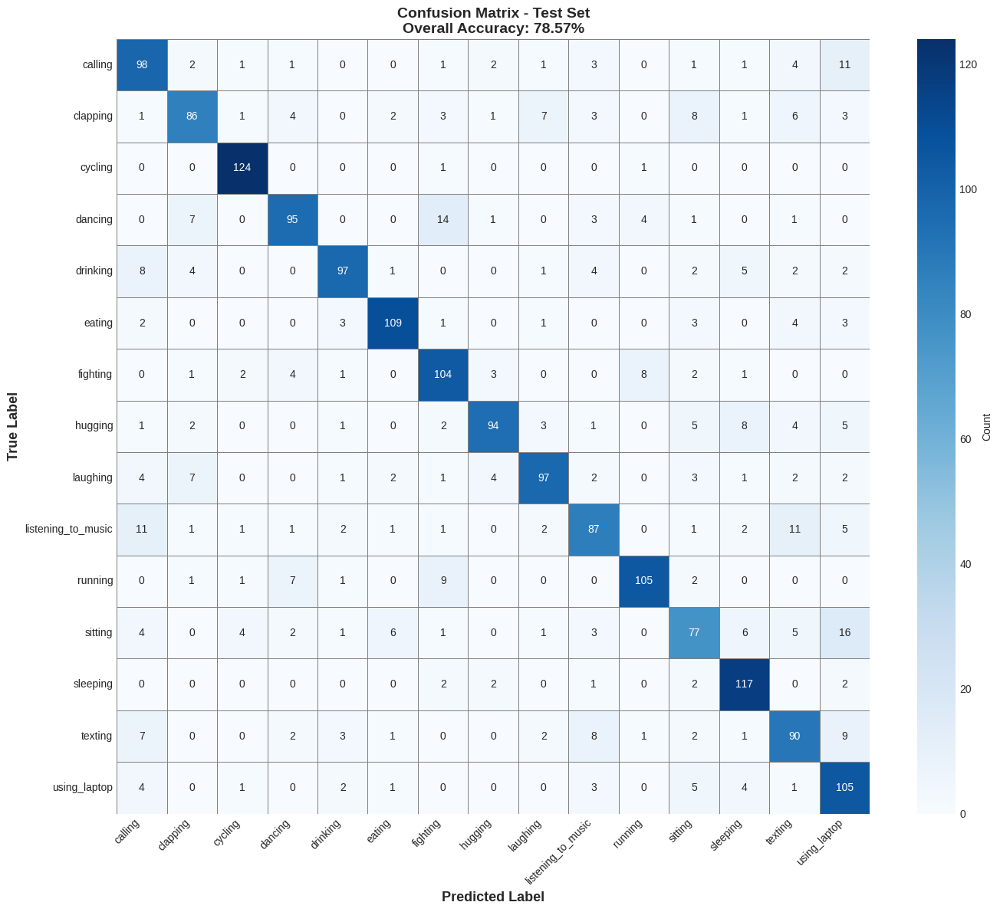


PER-CLASS ACCURACY

             Class  Correct  Total  Accuracy (%)
           cycling      124    126     98.412698
          sleeping      117    126     92.857143
            eating      109    126     86.507937
           running      105    126     83.333333
      using_laptop      105    126     83.333333
          fighting      104    126     82.539683
           calling       98    126     77.777778
          drinking       97    126     76.984127
          laughing       97    126     76.984127
           dancing       95    126     75.396825
           hugging       94    126     74.603175
           texting       90    126     71.428571
listening_to_music       87    126     69.047619
          clapping       86    126     68.253968
           sitting       77    126     61.111111

 Per-class accuracy saved: /kaggle/working/results/per_class_accuracy.csv
 Per-class accuracy plot saved: /kaggle/working/plots/per_class_accuracy.png


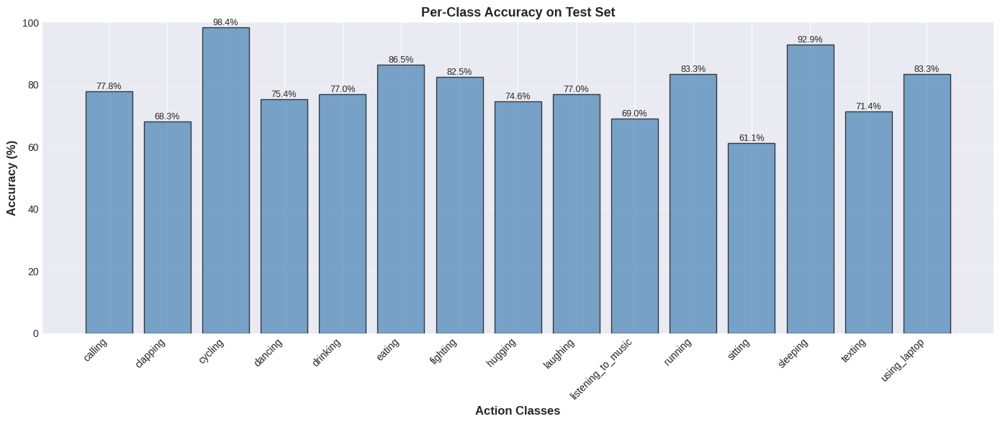


EVALUATION SUMMARY

 Image Captioning Model:
   Test Loss: 2.6035

 Action Recognition Model:
   Test Loss: 0.6965
   Test Accuracy: 78.57%
   Best Class: cycling (98.41%)
   Worst Class: sitting (61.11%)

 All evaluation metrics computed and saved!


In [20]:
# ===== LOAD BEST MODELS =====
print("\n Loading best model checkpoints...")

# Load best caption model
best_caption_path = os.path.join(CHECKPOINTS_DIR, 'caption_model_epoch_15_best.pth')
if os.path.exists(best_caption_path):
    epoch, loss, _ = load_checkpoint(caption_model, optimizer_caption, best_caption_path)
    print(f" Caption model loaded: Epoch {epoch}, Loss {loss:.4f}")
else:
    print(" Best caption model not found, using current model")

# Load best action model
best_action_path = os.path.join(CHECKPOINTS_DIR, 'action_model_epoch_5_best.pth')
if os.path.exists(best_action_path):
    epoch, loss, acc = load_checkpoint(action_model, optimizer_action, best_action_path)
    print(f" Action model loaded: Epoch {epoch}, Acc {acc:.2f}%")
else:
    print(" Best action model not found, using current model")

# ===== EVALUATE CAPTION MODEL =====
print("\n" + "=" * 80)
print("EVALUATING IMAGE CAPTIONING MODEL")
print("=" * 80)

caption_model.eval()
test_losses_caption = AverageMeter()

print("\n Computing test loss...")
with torch.no_grad():
    pbar = tqdm(test_loader_caption, desc='Testing Caption Model')
    for images, captions, lengths in pbar:
        images = images.to(device)
        captions = captions.to(device)
        
        outputs = caption_model(images, captions, lengths)
        outputs = outputs.reshape(-1, outputs.shape[2])
        targets = captions.reshape(-1)
        
        loss = criterion_caption(outputs, targets)
        test_losses_caption.update(loss.item(), images.size(0))
        
        pbar.set_postfix({'loss': f'{test_losses_caption.avg:.4f}'})

print(f"\n Test Loss: {test_losses_caption.avg:.4f}")

# ===== EVALUATE ACTION MODEL =====
print("\n" + "=" * 80)
print("EVALUATING ACTION RECOGNITION MODEL")
print("=" * 80)

action_model.eval()
test_losses_action = AverageMeter()
test_accuracies_action = AverageMeter()

all_test_predictions = []
all_test_labels = []

print("\n Computing test metrics...")
with torch.no_grad():
    pbar = tqdm(test_loader_action, desc='Testing Action Model')
    for images, labels in pbar:
        images = images.to(device)
        labels = labels.to(device)
        
        outputs = action_model(images)
        loss = criterion_action(outputs, labels)
        
        _, predictions = outputs.max(dim=1)
        accuracy = (predictions == labels).float().mean() * 100
        
        test_losses_action.update(loss.item(), images.size(0))
        test_accuracies_action.update(accuracy.item(), images.size(0))
        
        all_test_predictions.extend(predictions.cpu().numpy())
        all_test_labels.extend(labels.cpu().numpy())
        
        pbar.set_postfix({
            'loss': f'{test_losses_action.avg:.4f}',
            'acc': f'{test_accuracies_action.avg:.2f}%'
        })

print(f"\n Test Loss: {test_losses_action.avg:.4f}")
print(f" Test Accuracy: {test_accuracies_action.avg:.2f}%")

# ===== DETAILED CLASSIFICATION REPORT =====
print("\n" + "=" * 80)
print("DETAILED CLASSIFICATION REPORT")
print("=" * 80)

from sklearn.metrics import classification_report, confusion_matrix

# Generate classification report
report = classification_report(
    all_test_labels,
    all_test_predictions,
    target_names=ACTION_CONFIG['class_names'],
    digits=4
)

print("\n" + report)

# Save report
report_path = os.path.join(RESULTS_DIR, 'classification_report.txt')
with open(report_path, 'w') as f:
    f.write("ACTION RECOGNITION - TEST SET CLASSIFICATION REPORT\n")
    f.write("=" * 80 + "\n\n")
    f.write(report)
print(f"\n Classification report saved: {report_path}")

# ===== CONFUSION MATRIX =====
print("\n Generating confusion matrix...")

cm = confusion_matrix(all_test_labels, all_test_predictions)

# Plot confusion matrix
plt.figure(figsize=(14, 12))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=ACTION_CONFIG['class_names'],
    yticklabels=ACTION_CONFIG['class_names'],
    cbar_kws={'label': 'Count'},
    linewidths=0.5,
    linecolor='gray'
)
plt.xlabel('Predicted Label', fontsize=13, weight='bold')
plt.ylabel('True Label', fontsize=13, weight='bold')
plt.title(f'Confusion Matrix - Test Set\nOverall Accuracy: {test_accuracies_action.avg:.2f}%', 
         fontsize=14, weight='bold')
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.tight_layout()

cm_path = os.path.join(PLOTS_DIR, 'confusion_matrix_test.png')
plt.savefig(cm_path, dpi=150, bbox_inches='tight')
print(f" Confusion matrix saved: {cm_path}")
plt.show()

# ===== PER-CLASS ACCURACY =====
print("\n" + "=" * 80)
print("PER-CLASS ACCURACY")
print("=" * 80)

class_correct = np.zeros(ACTION_CONFIG['num_classes'])
class_total = np.zeros(ACTION_CONFIG['num_classes'])

for pred, label in zip(all_test_predictions, all_test_labels):
    class_total[label] += 1
    if pred == label:
        class_correct[label] += 1

class_accuracies = (class_correct / class_total) * 100

# Create DataFrame for better visualization
per_class_df = pd.DataFrame({
    'Class': ACTION_CONFIG['class_names'],
    'Correct': class_correct.astype(int),
    'Total': class_total.astype(int),
    'Accuracy (%)': class_accuracies
})

per_class_df = per_class_df.sort_values('Accuracy (%)', ascending=False)

print("\n" + per_class_df.to_string(index=False))

# Save per-class accuracy
per_class_path = os.path.join(RESULTS_DIR, 'per_class_accuracy.csv')
per_class_df.to_csv(per_class_path, index=False)
print(f"\n Per-class accuracy saved: {per_class_path}")

# Plot per-class accuracy
plt.figure(figsize=(14, 6))
bars = plt.bar(range(len(ACTION_CONFIG['class_names'])), class_accuracies, 
               color='steelblue', alpha=0.7, edgecolor='black')
plt.xlabel('Action Classes', fontsize=12, weight='bold')
plt.ylabel('Accuracy (%)', fontsize=12, weight='bold')
plt.title('Per-Class Accuracy on Test Set', fontsize=13, weight='bold')
plt.xticks(range(len(ACTION_CONFIG['class_names'])), 
           ACTION_CONFIG['class_names'], rotation=45, ha='right')
plt.ylim(0, 100)
plt.grid(axis='y', alpha=0.3)

# Add accuracy labels on bars
for i, bar in enumerate(bars):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
            f'{height:.1f}%',
            ha='center', va='bottom', fontsize=9)

plt.tight_layout()
per_class_plot_path = os.path.join(PLOTS_DIR, 'per_class_accuracy.png')
plt.savefig(per_class_plot_path, dpi=150, bbox_inches='tight')
print(f" Per-class accuracy plot saved: {per_class_plot_path}")
plt.show()

# ===== FINAL SUMMARY =====
print("\n" + "=" * 80)
print("EVALUATION SUMMARY")
print("=" * 80)

print("\n Image Captioning Model:")
print(f"   Test Loss: {test_losses_caption.avg:.4f}")

print("\n Action Recognition Model:")
print(f"   Test Loss: {test_losses_action.avg:.4f}")
print(f"   Test Accuracy: {test_accuracies_action.avg:.2f}%")
print(f"   Best Class: {ACTION_CONFIG['class_names'][class_accuracies.argmax()]} ({class_accuracies.max():.2f}%)")
print(f"   Worst Class: {ACTION_CONFIG['class_names'][class_accuracies.argmin()]} ({class_accuracies.min():.2f}%)")

print("\n All evaluation metrics computed and saved!")
print("=" * 80)

In [21]:
def generate_caption_for_image(model, image_path, vocab, transform, device, max_length=50):
    """
    Generate caption for a single image
    
    Args:
        model: Trained caption model
        image_path: Path to image
        vocab: Vocabulary object
        transform: Image transformation
        device: Device to run inference on
        max_length: Maximum caption length
    
    Returns:
        caption: Generated caption string
        image: PIL Image
    """
    model.eval()
    
    # Load and transform image
    image = Image.open(image_path).convert('RGB')
    image_tensor = transform(image).unsqueeze(0).to(device)
    
    # Generate caption
    with torch.no_grad():
        if isinstance(model, nn.DataParallel):
            caption_indices = model.module.generate_caption(image_tensor, max_length)
        else:
            caption_indices = model.generate_caption(image_tensor, max_length)
    
    # Decode caption
    caption_indices = caption_indices[0].cpu().numpy()
    caption_words = vocab.decode(caption_indices)
    
    # Remove special tokens and create caption
    caption = []
    for word in caption_words:
        if word == vocab.start_token:
            continue
        if word == vocab.end_token:
            break
        if word == vocab.pad_token:
            break
        caption.append(word)
    
    caption_text = ' '.join(caption)
    
    return caption_text, image

def predict_action_for_image(model, image_path, class_names, transform, device):
    """
    Predict action for a single image
    
    Args:
        model: Trained action model
        image_path: Path to image
        class_names: List of class names
        transform: Image transformation
        device: Device to run inference on
    
    Returns:
        predicted_class: Predicted class name
        confidence: Confidence score
        all_probs: All class probabilities
        image: PIL Image
    """
    model.eval()
    
    # Load and transform image
    image = Image.open(image_path).convert('RGB')
    image_tensor = transform(image).unsqueeze(0).to(device)
    
    # Predict
    with torch.no_grad():
        outputs = model(image_tensor)
        probabilities = torch.softmax(outputs, dim=1)
        confidence, predicted_idx = probabilities.max(dim=1)
    
    predicted_class = class_names[predicted_idx.item()]
    confidence = confidence.item() * 100
    all_probs = probabilities[0].cpu().numpy() * 100
    
    return predicted_class, confidence, all_probs, image

print("\n generate_caption_for_image() function created")
print(" predict_action_for_image() function created")

# ===== TEST INFERENCE FUNCTIONS =====
print("TESTING INFERENCE FUNCTIONS")

# Test caption generation on a sample image
print("\n Testing caption generation...")
sample_caption_image = os.path.join(FLICKR8K_IMAGES_PATH, test_images[0])

if os.path.exists(sample_caption_image):
    caption, img = generate_caption_for_image(
        caption_model,
        sample_caption_image,
        vocab,
        val_transform_caption,
        device,
        max_length=30
    )
    print(f" Sample image: {test_images[0]}")
    print(f" Generated caption: '{caption}'")
else:
    print(" Sample image not found")

# Test action recognition on a sample image
print("\n Testing action recognition...")

# Find a sample test image
sample_action_class = ACTION_CONFIG['class_names'][0]
sample_action_dir = os.path.join(ACTION_TEST_PATH, sample_action_class)

if os.path.exists(sample_action_dir):
    sample_files = [f for f in os.listdir(sample_action_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
    if sample_files:
        sample_action_image = os.path.join(sample_action_dir, sample_files[0])
        
        predicted_class, confidence, all_probs, img = predict_action_for_image(
            action_model,
            sample_action_image,
            ACTION_CONFIG['class_names'],
            val_transform_action,
            device
        )
        
        print(f" Sample image: {sample_action_class}/{sample_files[0]}")
        print(f" Predicted action: '{predicted_class}' ({confidence:.2f}% confidence)")
        print(f" Top 3 predictions:")
        top_3_indices = np.argsort(all_probs)[-3:][::-1]
        for idx in top_3_indices:
            print(f"   - {ACTION_CONFIG['class_names'][idx]}: {all_probs[idx]:.2f}%")

print("INFERENCE FUNCTIONS READY")


 generate_caption_for_image() function created
 predict_action_for_image() function created
TESTING INFERENCE FUNCTIONS

 Testing caption generation...
 Sample image: 3385593926_d3e9c21170.jpg
 Generated caption: 'two dogs are running through the snow'

 Testing action recognition...
 Sample image: calling/Image_11414.jpg
 Predicted action: 'calling' (70.97% confidence)
 Top 3 predictions:
   - calling: 70.97%
   - listening_to_music: 21.54%
   - texting: 2.07%
INFERENCE FUNCTIONS READY


GENERATING SAMPLE PREDICTIONS

 Generating caption predictions...


Generating captions:   0%|          | 0/6 [00:00<?, ?it/s]


 Caption predictions saved: /kaggle/working/predictions/caption_predictions.png


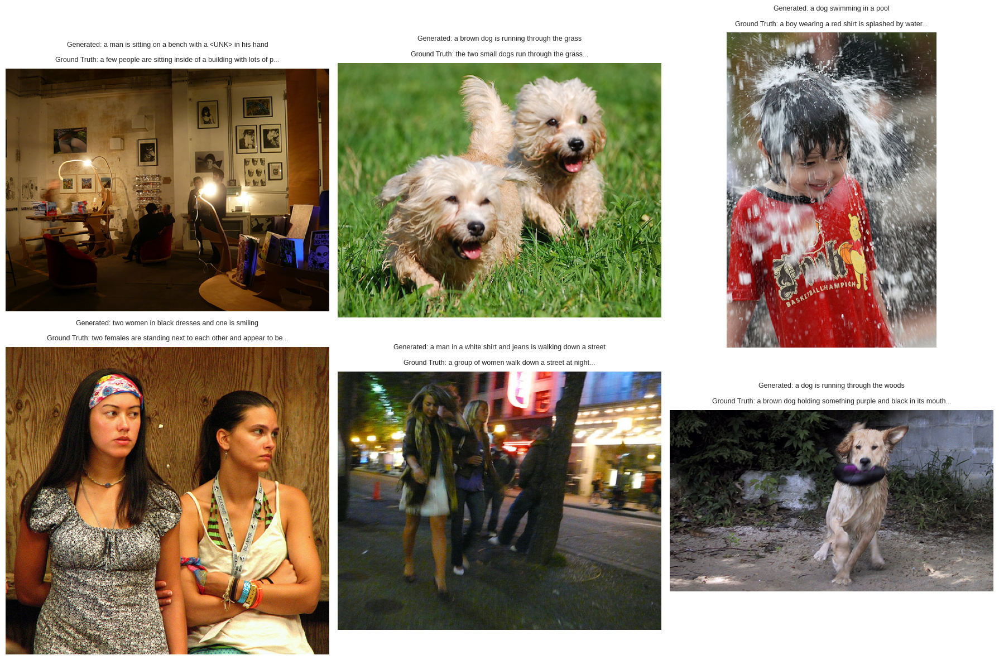


 Generating action predictions...


Predicting actions:   0%|          | 0/12 [00:00<?, ?it/s]


 Action predictions saved: /kaggle/working/predictions/action_predictions.png


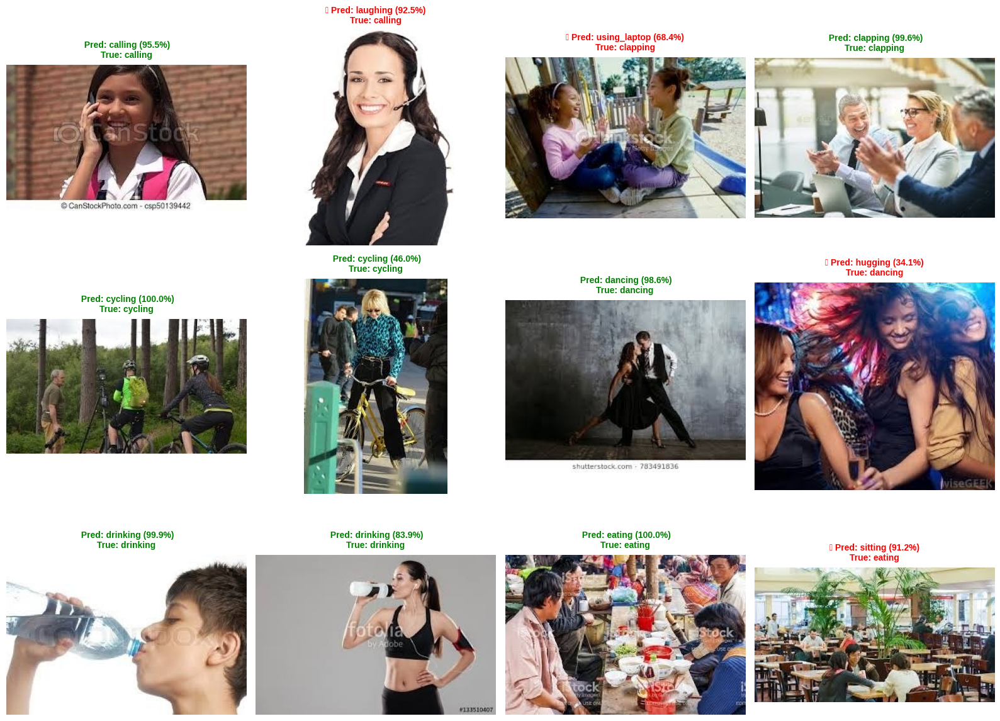


 Generating detailed action predictions...

 Detailed predictions saved: /kaggle/working/predictions/detailed_action_predictions.png


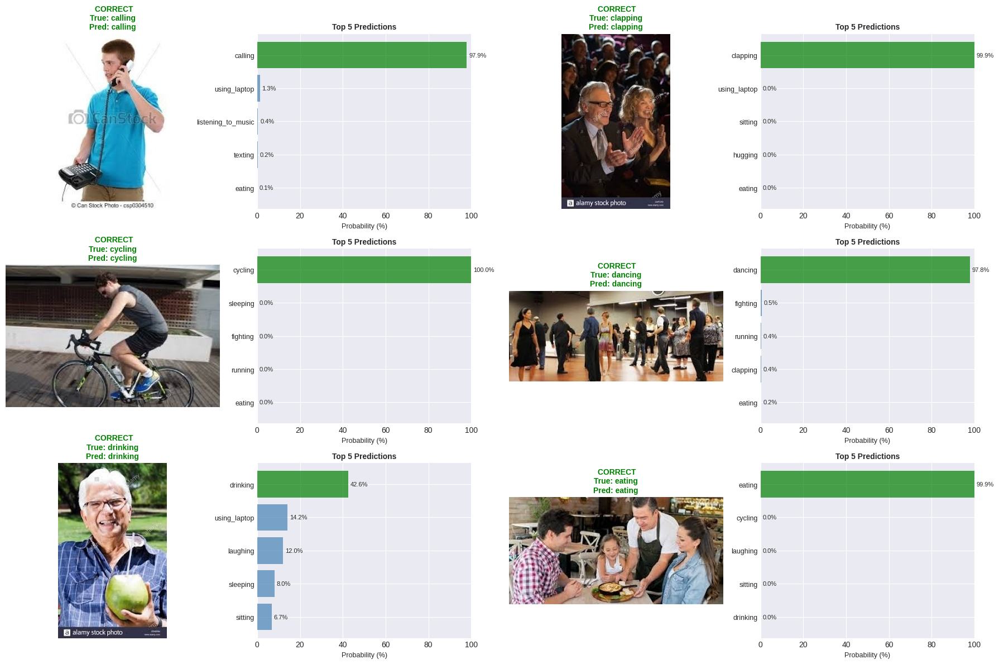


SAMPLE PREDICTIONS GENERATED

 All prediction visualizations saved to: /kaggle/working/predictions/


In [22]:
print("GENERATING SAMPLE PREDICTIONS")

# ===== VISUALIZE CAPTION PREDICTIONS =====
print("\n Generating caption predictions...")

# Select random test images
np.random.seed(SEED)
random_caption_indices = np.random.choice(len(test_images), 6, replace=False)
sample_caption_images = [test_images[i] for i in random_caption_indices]

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.ravel()

for idx, img_name in enumerate(tqdm(sample_caption_images, desc="Generating captions")):
    img_path = os.path.join(FLICKR8K_IMAGES_PATH, img_name)
    
    if os.path.exists(img_path):
        # Generate caption
        generated_caption, img = generate_caption_for_image(
            caption_model,
            img_path,
            vocab,
            val_transform_caption,
            device,
            max_length=30
        )
        
        # Get ground truth caption
        gt_caption = captions_dict.get(img_name, ["No caption"])[0]
        
        # Display image
        axes[idx].imshow(img)
        axes[idx].axis('off')
        
        # Add captions as title
        title_text = f"Generated: {generated_caption}\n\nGround Truth: {gt_caption[:60]}..."
        axes[idx].set_title(title_text, fontsize=9, wrap=True, pad=10)

plt.tight_layout()
caption_pred_path = os.path.join(PREDICTIONS_DIR, 'caption_predictions.png')
plt.savefig(caption_pred_path, dpi=150, bbox_inches='tight')
print(f"\n Caption predictions saved: {caption_pred_path}")
plt.show()

# ===== VISUALIZE ACTION PREDICTIONS =====
print("\n Generating action predictions...")

# Select 2 random samples from each class (12 total)
sample_action_images = []
sample_action_labels = []

for class_name in ACTION_CONFIG['class_names'][:6]:  # First 6 classes
    class_dir = os.path.join(ACTION_TEST_PATH, class_name)
    if os.path.exists(class_dir):
        images = [f for f in os.listdir(class_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
        if len(images) >= 2:
            selected = np.random.choice(images, 2, replace=False)
            for img_file in selected:
                sample_action_images.append(os.path.join(class_dir, img_file))
                sample_action_labels.append(class_name)

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.ravel()

for idx, (img_path, true_label) in enumerate(tqdm(zip(sample_action_images, sample_action_labels), 
                                                   desc="Predicting actions",
                                                   total=len(sample_action_images))):
    if idx >= 12:
        break
    
    # Predict action
    predicted_class, confidence, all_probs, img = predict_action_for_image(
        action_model,
        img_path,
        ACTION_CONFIG['class_names'],
        val_transform_action,
        device
    )
    
    # Display image
    axes[idx].imshow(img)
    axes[idx].axis('off')
    
    # Add prediction as title with color coding
    is_correct = predicted_class == true_label
    color = 'green' if is_correct else 'red'
    status = '' if is_correct else '✗'
    
    title_text = f"{status} Pred: {predicted_class} ({confidence:.1f}%)\nTrue: {true_label}"
    axes[idx].set_title(title_text, fontsize=10, weight='bold', color=color, pad=8)

plt.tight_layout()
action_pred_path = os.path.join(PREDICTIONS_DIR, 'action_predictions.png')
plt.savefig(action_pred_path, dpi=150, bbox_inches='tight')
print(f"\n Action predictions saved: {action_pred_path}")
plt.show()

# ===== DETAILED ACTION PREDICTION WITH PROBABILITIES =====
print("\n Generating detailed action predictions...")

# Select one sample from each class
detailed_samples = []
for class_name in ACTION_CONFIG['class_names']:
    class_dir = os.path.join(ACTION_TEST_PATH, class_name)
    if os.path.exists(class_dir):
        images = [f for f in os.listdir(class_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
        if images:
            selected = np.random.choice(images, 1)[0]
            detailed_samples.append((os.path.join(class_dir, selected), class_name))

# Show 6 samples with probability bars
fig = plt.figure(figsize=(18, 12))

for idx, (img_path, true_label) in enumerate(detailed_samples[:6]):
    # Predict
    predicted_class, confidence, all_probs, img = predict_action_for_image(
        action_model,
        img_path,
        ACTION_CONFIG['class_names'],
        val_transform_action,
        device
    )
    
    # Image subplot
    ax_img = plt.subplot(3, 4, idx * 2 + 1)
    ax_img.imshow(img)
    ax_img.axis('off')
    
    is_correct = predicted_class == true_label
    color = 'green' if is_correct else 'red'
    status = ' CORRECT' if is_correct else '✗ WRONG'
    
    ax_img.set_title(f"{status}\nTrue: {true_label}\nPred: {predicted_class}", 
                     fontsize=10, weight='bold', color=color)
    
    # Probability bar chart
    ax_prob = plt.subplot(3, 4, idx * 2 + 2)
    
    # Get top 5 predictions
    top_5_indices = np.argsort(all_probs)[-5:][::-1]
    top_5_classes = [ACTION_CONFIG['class_names'][i] for i in top_5_indices]
    top_5_probs = all_probs[top_5_indices]
    
    # Color bars based on correctness
    colors = ['green' if cls == true_label else 'steelblue' for cls in top_5_classes]
    
    bars = ax_prob.barh(range(5), top_5_probs, color=colors, alpha=0.7)
    ax_prob.set_yticks(range(5))
    ax_prob.set_yticklabels(top_5_classes, fontsize=9)
    ax_prob.set_xlabel('Probability (%)', fontsize=9)
    ax_prob.set_title('Top 5 Predictions', fontsize=10, weight='bold')
    ax_prob.set_xlim(0, 100)
    ax_prob.invert_yaxis()
    
    # Add percentage labels
    for i, (bar, prob) in enumerate(zip(bars, top_5_probs)):
        ax_prob.text(prob + 1, i, f'{prob:.1f}%', 
                    va='center', fontsize=8)

plt.tight_layout()
detailed_pred_path = os.path.join(PREDICTIONS_DIR, 'detailed_action_predictions.png')
plt.savefig(detailed_pred_path, dpi=150, bbox_inches='tight')
print(f"\n Detailed predictions saved: {detailed_pred_path}")
plt.show()

print("\n" + "=" * 80)
print("SAMPLE PREDICTIONS GENERATED")
print("=" * 80)
print(f"\n All prediction visualizations saved to: {PREDICTIONS_DIR}/")
print("=" * 80)

In [23]:
# ===== SAVE CAPTION MODEL =====
print("\n Saving Image Captioning Model...")

# Save complete model (for easy loading)
caption_model_final_path = os.path.join(MODELS_DIR, 'caption_model_final.pth')
if isinstance(caption_model, nn.DataParallel):
    torch.save(caption_model.module.state_dict(), caption_model_final_path)
else:
    torch.save(caption_model.state_dict(), caption_model_final_path)

print(f" Model weights saved: {caption_model_final_path}")

# Save model configuration
caption_config_path = os.path.join(MODELS_DIR, 'caption_model_config.pkl')
caption_config_save = {
    'embed_size': CAPTION_CONFIG['embed_size'],
    'hidden_size': CAPTION_CONFIG['hidden_size'],
    'vocab_size': CAPTION_CONFIG['vocab_size'],
    'num_layers': CAPTION_CONFIG['num_layers'],
    'dropout': CAPTION_CONFIG['dropout'],
    'max_caption_length': CAPTION_CONFIG['max_caption_length']
}
with open(caption_config_path, 'wb') as f:
    pickle.dump(caption_config_save, f)

print(f" Model config saved: {caption_config_path}")

# ===== SAVE ACTION MODEL =====
print("\n Saving Action Recognition Model...")

# Save complete model
action_model_final_path = os.path.join(MODELS_DIR, 'action_model_final.pth')
if isinstance(action_model, nn.DataParallel):
    torch.save(action_model.module.state_dict(), action_model_final_path)
else:
    torch.save(action_model.state_dict(), action_model_final_path)

print(f" Model weights saved: {action_model_final_path}")

# Save model configuration
action_config_path = os.path.join(MODELS_DIR, 'action_model_config.pkl')
action_config_save = {
    'num_classes': ACTION_CONFIG['num_classes'],
    'class_names': ACTION_CONFIG['class_names'],
    'dropout': ACTION_CONFIG['dropout']
}
with open(action_config_path, 'wb') as f:
    pickle.dump(action_config_save, f)

print(f" Model config saved: {action_config_path}")

# ===== CREATE MODEL INFO FILE =====
print("\n Creating model info file...")

model_info = {
    'caption_model': {
        'architecture': 'CNN (ResNet50) + LSTM',
        'test_loss': test_losses_caption.avg,
        'vocab_size': CAPTION_CONFIG['vocab_size'],
        'trainable_params': 6501036,
        'model_file': 'caption_model_final.pth',
        'config_file': 'caption_model_config.pkl',
        'vocab_file': '../vocab/vocab.pkl'
    },
    'action_model': {
        'architecture': 'ResNet50 (Fine-tuned)',
        'test_accuracy': test_accuracies_action.avg,
        'test_loss': test_losses_action.avg,
        'num_classes': ACTION_CONFIG['num_classes'],
        'class_names': ACTION_CONFIG['class_names'],
        'trainable_params': 24565839,
        'model_file': 'action_model_final.pth',
        'config_file': 'action_model_config.pkl'
    },
    'training_info': {
        'date': 'January 2026',
        'framework': 'PyTorch',
        'device': 'Kaggle 2x T4 GPUs',
        'caption_epochs': len(history_caption['train_loss']),
        'action_epochs': len(history_action['train_loss'])
    }
}

model_info_path = os.path.join(MODELS_DIR, 'model_info.json')
with open(model_info_path, 'w') as f:
    json.dump(model_info, f, indent=4)

print(f"Model info saved: {model_info_path}")

# ===== VERIFY SAVED FILES =====
print("\n" + "=" * 80)
print("VERIFYING SAVED FILES")
print("=" * 80)

required_files = [
    ('Caption Model', caption_model_final_path),
    ('Caption Config', caption_config_path),
    ('Action Model', action_model_final_path),
    ('Action Config', action_config_path),
    ('Vocabulary', os.path.join(VOCAB_DIR, 'vocab.pkl')),
    ('Model Info', model_info_path)
]

print("\nRequired files for deployment:")
all_present = True
for name, path in required_files:
    exists = os.path.exists(path)
    status = "✓" if exists else "✗"
    size = os.path.getsize(path) / (1024 * 1024) if exists else 0
    print(f"  {status} {name:20s}: {size:6.2f} MB - {path}")
    all_present = all_present and exists

if all_present:
    print("\n All required files present and ready for deployment!")
else:
    print("\n Some files are missing!")



 Saving Image Captioning Model...
 Model weights saved: /kaggle/working/models/caption_model_final.pth
 Model config saved: /kaggle/working/models/caption_model_config.pkl

 Saving Action Recognition Model...
 Model weights saved: /kaggle/working/models/action_model_final.pth
 Model config saved: /kaggle/working/models/action_model_config.pkl

 Creating model info file...
Model info saved: /kaggle/working/models/model_info.json

VERIFYING SAVED FILES

Required files for deployment:
  ✓ Caption Model       : 114.79 MB - /kaggle/working/models/caption_model_final.pth
  ✓ Caption Config      :   0.00 MB - /kaggle/working/models/caption_model_config.pkl
  ✓ Action Model        :  94.03 MB - /kaggle/working/models/action_model_final.pth
  ✓ Action Config       :   0.00 MB - /kaggle/working/models/action_model_config.pkl
  ✓ Vocabulary          :   0.06 MB - /kaggle/working/vocab/vocab.pkl
  ✓ Model Info          :   0.00 MB - /kaggle/working/models/model_info.json

 All required files pres